# Name: Muhid Qaiser, Roll-No: 22i-0472, Section: AI-B

# Import Libraries

In [84]:
import pandas as pd
import numpy as np
import re
import json
from docx import Document
import glob
from datetime import datetime
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import  train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, mean_squared_error, mean_absolute_error
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import holidays
import matplotlib.image as mpimg



# Creating Functions

In [86]:

def process_dataframe_onehot(df):

    for col in df.select_dtypes(include=['datetime64[ns]']):
        df[col] = df[col].astype(np.int64) // 10**9 // 60  
    
    object_cols = df.select_dtypes(include=['object']).columns
    if len(object_cols) > 0:
        encoder = OneHotEncoder(sparse_output=False, drop='first')  
        
        encoded_cols = encoder.fit_transform(df[object_cols])
        
        encoded_df = pd.DataFrame(
            encoded_cols, 
            columns=encoder.get_feature_names_out(object_cols),
            index=df.index  
        )
        
        df = df.drop(columns=object_cols)
        df = pd.concat([df, encoded_df], axis=1)
    
    return df


def generate_folds(X, Y, nfolds=4):

    classes = np.unique(Y)
    print ('Generating CV data for {} classes'.format(len(classes)))
    
    cvlist = []  # four elements per nested-list
    # idxlist=[] # 2 elements per list to contain indeces...
    
    for cidx, c in enumerate(classes):
        idx = Y == c  # find class example indeces
        Yt = Y[idx]  # get class labels
        Xt = X[idx, :]  # get training examples
        nexamples = Xt.shape[0]
        # Generate a random permutation of the indeces
        ridx = np.arange(nexamples)  # generate indeces
        np.random.shuffle(ridx)  # shuffle randomly ...

        # number of test examples per fold
        nexamples = nexamples // nfolds
        sridx = set(ridx)  # create a set of all indeces
        sidx = 0
        for k in range(nfolds):
            testidx = ridx[sidx:sidx + nexamples]
            trainidx = list(sridx.difference(testidx)) # take a set difference
            sidx += nexamples
            
            if cidx == 0:
                cvlist.append([Xt[trainidx, :], Yt[trainidx], Xt[testidx, :], Yt[testidx]])

            else:  # append to the set...
                cvlist[k][0] = np.vstack((cvlist[k][0], Xt[trainidx, :]))
                cvlist[k][1] = np.hstack((cvlist[k][1], Yt[trainidx]))
                cvlist[k][2] = np.vstack((cvlist[k][2], Xt[testidx, :]))
                cvlist[k][3] = np.hstack((cvlist[k][3], Yt[testidx]))
                
    return cvlist



def natural_sort_key(s):
    return [int(text) if text.isdigit() else text.lower() for text in re.split('(\d+)', s)]


def get_evaluations(y_test, yp):
    
    # Accuracy
    accuracy = accuracy_score(y_test, yp)
    print(f"Accuracy: {accuracy:.4f}")

    # Precision, Recall, F1-Score (with zero_division=0)
    precision = precision_score(y_test, yp, average='macro', zero_division=0)
    recall = recall_score(y_test, yp, average='macro', zero_division=0)
    f1 = f1_score(y_test, yp, average='macro', zero_division=0)
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1-Score: {f1:.4f}")

    # Class-wise Precision and Recall (zero_division=0)
    print("\nClass-wise Precision and Recall:")
    report = classification_report(y_test, yp, target_names=[f"Class {i}" for i in np.unique(y_test)], zero_division=0)
    print(report)

    # Confusion Matrix
    conf_matrix = confusion_matrix(y_test, yp)
    print("\nConfusion Matrix:")
    print(conf_matrix)

    plt.figure(figsize=(10, 7))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix Heatmap')
    plt.show()


def day_time(hour):
    if 5 <= hour < 12:
        return 'Morning'
    elif 12 <= hour < 17:
        return 'Afternoon'
    elif 17 <= hour < 21:
        return 'Evening'
    else:
        return 'Night'

def add_temporal_features(df, datetime_column, country_holidays):
    df[datetime_column] = pd.to_datetime(df[datetime_column], errors='coerce')  # Ensure datetime conversion

    # Extract holiday dates
    holiday_dates = set(country_holidays)  # Use the set of dates for efficient lookup

    # Extract temporal features
    df['day_of_week'] = df[datetime_column].dt.day_name()
    df['hour_of_day'] = df[datetime_column].dt.hour
    df['month_of_year'] = df[datetime_column].dt.month
    df['day_of_month'] = df[datetime_column].dt.day
    df['week_of_year'] = df[datetime_column].dt.isocalendar().week
    df['is_weekend'] = df[datetime_column].dt.weekday >= 5
    df['time_of_day'] = df[datetime_column].dt.hour.apply(day_time)
    df['is_holiday'] = df[datetime_column].dt.date.isin(holiday_dates)  # Check if date is in holidays

    return df


def categorize_column(minutes):
    if minutes == 0:
        return 'No Delay'
    elif minutes < 45:
        return 'Short Delay'
    elif minutes <= 175:
        return 'Moderate Delay'
    else:
        return 'Long Delay'



<>:64: SyntaxWarning: invalid escape sequence '\d'
<>:64: SyntaxWarning: invalid escape sequence '\d'
C:\Users\pc\AppData\Local\Temp\ipykernel_18480\149652915.py:64: SyntaxWarning: invalid escape sequence '\d'
  return [int(text) if text.isdigit() else text.lower() for text in re.split('(\d+)', s)]


# Loading data

In [87]:

def read_docx_to_json(file_path):
    
    doc = Document(file_path)
    text = ""
    for paragraph in doc.paragraphs:
        text += paragraph.text
    return json.loads(text)

def flatten_json(nested_json, parent_key="", sep="_"):
    
    items = []
    for key, value in nested_json.items():
        new_key = f"{parent_key}{sep}{key}" if parent_key else key
        if isinstance(value, dict):
            items.extend(flatten_json(value, new_key, sep=sep).items())
        else:
            items.append((new_key, value))
    return dict(items)

def convert_json_to_dataframe(json_data):
    
    flattened_data = [flatten_json(record) for record in json_data]
    return pd.DataFrame(flattened_data)

def process_docx_files_to_dataframe(directory_path, output_file="output.xlsx"):
    
    all_files = glob.glob(f"{directory_path}/*.docx")
    all_data = []

    all_files = sorted(all_files, key=natural_sort_key)

    for file in all_files:
        try:
            json_data = read_docx_to_json(file)
            all_data.extend(json_data)
        except Exception as e:
            print(f"Error processing file {file}: {e}")
    
    df = convert_json_to_dataframe(all_data)
    
    df.to_excel(output_file, index=False)
    
    print(f"Data saved to {output_file}")
    return df

directory_path = "../ML-Proj-Dataset/Train" 
output_file = "output.xlsx"           
df_outputs = process_docx_files_to_dataframe(directory_path, output_file=output_file)



Data saved to output.xlsx


In [88]:


def combine_excel_files(input_directory, output_file):

    # Get a list of all Excel files in the input directory
    excel_files = glob.glob(f"{input_directory}/*.xlsx")
    
    if not excel_files:
        print("No Excel files found in the specified directory.")
        return
    
    excel_files =  sorted(excel_files, key=natural_sort_key)
    
    # Initialize an empty list to store DataFrames
    dataframes = []
    
    # Read each Excel file and append the DataFrame to the list
    for file in excel_files:
        try:
            df = pd.read_excel(file)
            dataframes.append(df)
            print(f"Read file: {file}, with shape: {df.shape}")
        except Exception as e:
            print(f"Error reading file {file}: {e}")
    
    combined_df = pd.concat(dataframes, ignore_index=True)
    
    combined_df.to_excel(output_file, index=False)

    print(f"Combined data saved to {output_file}")

    return combined_df, excel_files

# input_directory = "../ML-Proj-Dataset/Weather"  
input_directory = "../ML-Proj-Dataset/Weather_preprocessed" 
output_file = "combined_output.xlsx"   
combined_df, ex = combine_excel_files(input_directory, output_file)


Read file: ../ML-Proj-Dataset/Weather_preprocessed\1.xlsx, with shape: (1, 7)
Read file: ../ML-Proj-Dataset/Weather_preprocessed\2.xlsx, with shape: (1, 7)
Read file: ../ML-Proj-Dataset/Weather_preprocessed\3.xlsx, with shape: (1, 7)
Read file: ../ML-Proj-Dataset/Weather_preprocessed\4.xlsx, with shape: (1, 7)
Read file: ../ML-Proj-Dataset/Weather_preprocessed\5.xlsx, with shape: (1, 7)
Read file: ../ML-Proj-Dataset/Weather_preprocessed\6.xlsx, with shape: (1, 7)
Read file: ../ML-Proj-Dataset/Weather_preprocessed\7.xlsx, with shape: (1, 7)
Read file: ../ML-Proj-Dataset/Weather_preprocessed\8.xlsx, with shape: (1, 7)
Read file: ../ML-Proj-Dataset/Weather_preprocessed\9.xlsx, with shape: (1, 7)
Read file: ../ML-Proj-Dataset/Weather_preprocessed\10.xlsx, with shape: (1, 7)
Read file: ../ML-Proj-Dataset/Weather_preprocessed\11.xlsx, with shape: (1, 7)
Read file: ../ML-Proj-Dataset/Weather_preprocessed\12.xlsx, with shape: (1, 7)
Read file: ../ML-Proj-Dataset/Weather_preprocessed\13.xlsx, w

# Weather Data Cleaning and Transformation

In [89]:

def parse_and_structure_data(df):
    # Maximum number of days in a month
    max_days = 31

    # Store results
    result = []

    # Loop through each row in the DataFrame
    for _, row in df.iterrows():
        # Extract the month and days
        month = row['Time'].split()[0]
        days = list(map(int, row['Time'].split()[1:max_days + 1]))

        # Extract the values for Temperature, Dew Point, etc.
        temp_values = list(map(float, row['Temperature (°F)'].split()[3:]))
        dew_point_values = list(map(float, row['Dew Point (°F)'].split()[3:]))
        humidity_values = list(map(float, row['Humidity (%)'].split()[3:]))
        wind_speed_values = list(map(float, row['Wind Speed (mph)'].split()[3:]))
        pressure_values = list(map(float, row['Pressure (in)'].split()[3:]))
        precipitation_values = list(map(float, row['Precipitation (in)'].split()[1:]))

        # Determine the number of days in the current month's data
        num_days = len(days)

        # Fill in structured data for each day
        for day in range(1, max_days + 1):
            if day in days:
                i = days.index(day)  # Get the index for the current day
                result.append({
                    "Time": f"{month} {day}",
                    "Temperature_Max (°F)": temp_values[i * 3],
                    "Temperature_Avg (°F)": temp_values[i * 3 + 1],
                    "Temperature_Min (°F)": temp_values[i * 3 + 2],
                    "Dew Point_Max (°F)": dew_point_values[i * 3],
                    "Dew Point_Avg (°F)": dew_point_values[i * 3 + 1],
                    "Dew Point_Min (°F)": dew_point_values[i * 3 + 2],
                    "Humidity_Max (%)": humidity_values[i * 3],
                    "Humidity_Avg (%)": humidity_values[i * 3 + 1],
                    "Humidity_Min (%)": humidity_values[i * 3 + 2],
                    "Wind Speed_Max (mph)": wind_speed_values[i * 3],
                    "Wind Speed_Avg (mph)": wind_speed_values[i * 3 + 1],
                    "Wind Speed_Min (mph)": wind_speed_values[i * 3 + 2],
                    "Pressure_Max (in)": pressure_values[i * 3],
                    "Pressure_Avg (in)": pressure_values[i * 3 + 1],
                    "Pressure_Min (in)": pressure_values[i * 3 + 2],
                    "Precipitation_Total (in)": precipitation_values[i]
                })
            else:
                # Append NaN for missing days
                result.append({
                    "Time": f"{month} {day}",
                    "Temperature_Max (°F)": np.nan,
                    "Temperature_Avg (°F)": np.nan,
                    "Temperature_Min (°F)": np.nan,
                    "Dew Point_Max (°F)": np.nan,
                    "Dew Point_Avg (°F)": np.nan,
                    "Dew Point_Min (°F)": np.nan,
                    "Humidity_Max (%)": np.nan,
                    "Humidity_Avg (%)": np.nan,
                    "Humidity_Min (%)": np.nan,
                    "Wind Speed_Max (mph)": np.nan,
                    "Wind Speed_Avg (mph)": np.nan,
                    "Wind Speed_Min (mph)": np.nan,
                    "Pressure_Max (in)": np.nan,
                    "Pressure_Avg (in)": np.nan,
                    "Pressure_Min (in)": np.nan,
                    "Precipitation_Total (in)": np.nan
                })

    # Convert the result into a DataFrame
    structured_df = pd.DataFrame(result)
    return structured_df


structured_df_weather = parse_and_structure_data(combined_df)





In [90]:

def assign_year(time_column):
    year = 2023  # Starting year for the first cycle
    result = []
    prev_month = None

    # Iterate through each date
    for value in time_column:
        try:
            month, day = value.split()  # Split the string into month and day
            day = int(day)  # Convert day to integer
            current_month = datetime.strptime(month, '%b').month  # Handle abbreviated month names

            # Assign the year
            if prev_month and current_month < prev_month:  # New year begins
                year += 1
            prev_month = current_month

            # Create the date with the year
            formatted_date = datetime(year, current_month, day).strftime('%Y-%m-%d')
            result.append(formatted_date)

        except ValueError as e:
            # Handle invalid date errors
            print(f"Invalid date '{value}': {e}")
            result.append(None)  # Assign None for invalid dates

    return result


# Apply the function to the "Time" column
new_combined_df = structured_df_weather.copy()
new_combined_df['Time'] = assign_year(structured_df_weather['Time'])


Invalid date 'Sep 31': day is out of range for month
Invalid date 'Nov 31': day is out of range for month
Invalid date 'Feb 30': day is out of range for month
Invalid date 'Feb 31': day is out of range for month
Invalid date 'Apr 31': day is out of range for month
Invalid date 'Jun 31': day is out of range for month


In [91]:
new_combined_df.to_csv('updated_weather_data.csv', index=False)

# Data Integration

In [92]:
new_combined_df = pd.read_csv('updated_weather_data.csv')
df_outputs = pd.read_excel('output.xlsx')

In [93]:

# Load the Excel files
weather_data = new_combined_df
output_data =  df_outputs

# Preprocess the 'departure_scheduledTime' column in output.xlsx to extract date
# output_data['departure_scheduledTime'] = output_data['departure_scheduledTime'].str.split('t').str[0]
output_data['departure_scheduledDate'] = output_data['departure_scheduledTime'].str.split('t').str[0]

# Merge the two dataframes on the matching 'Time' and 'departure_scheduledTime' columns
merged_df = pd.merge(
    output_data,
    weather_data,
    left_on='departure_scheduledDate',
    right_on='Time',
    how='left'
)


In [94]:
merged_df

,type,status,departure_iataCode,departure_icaoCode,departure_terminal,departure_scheduledTime,departure_estimatedTime,departure_actualTime,departure_estimatedRunway,departure_actualRunway,...,Humidity_Max (%),Humidity_Avg (%),Humidity_Min (%),Wind Speed_Max (mph),Wind Speed_Avg (mph),Wind Speed_Min (mph),Pressure_Max (in),Pressure_Avg (in),Pressure_Min (in),Precipitation_Total (in)
0,departure,active,lhe,opla,m,2023-07-20t20:50:00.000,2023-07-20t20:00:00.000,2023-07-20t20:15:00.000,2023-07-20t20:15:00.000,2023-07-20t20:15:00.000,...,89.0,76.0,63.0,12.0,5.3,0.0,28.9,28.8,28.7,0.0
1,departure,active,lhe,opla,NaN,2023-07-18t15:05:00.000,2023-07-18t15:05:00.000,NaN,NaN,NaN,...,84.0,73.8,63.0,17.0,10.2,0.0,28.8,28.8,28.7,0.0
2,departure,active,lhe,opla,NaN,2023-07-23t09:50:00.000,NaN,NaN,NaN,NaN,...,83.0,71.2,56.0,14.0,8.1,0.0,29.0,28.9,28.8,0.0
3,departure,active,lhe,opla,m,2023-07-26t23:30:00.000,2023-07-26t23:30:00.000,2023-07-26t23:51:00.000,2023-07-26t23:51:00.000,2023-07-26t23:51:00.000,...,100.0,77.4,59.0,17.0,8.1,0.0,28.9,28.9,28.8,0.0
4,departure,active,lhe,opla,m,2023-07-20t11:35:00.000,2023-07-20t17:15:00.000,NaN,NaN,NaN,...,89.0,76.0,63.0,12.0,5.3,0.0,28.9,28.8,28.7,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51567,departure,active,isb,opis,NaN,2024-07-06t19:00:00.000,2024-07-06t19:00:00.000,2024-07-06t19:25:00.000,2024-07-06t19:25:00.000,2024-07-06t19:25:00.000,...,100.0,85.9,74.0,28.0,12.9,3.0,28.7,28.7,28.6,0.0
51568,departure,active,isb,opis,NaN,2024-07-06t19:45:00.000,2024-07-06t19:58:00.000,NaN,NaN,NaN,...,100.0,85.9,74.0,28.0,12.9,3.0,28.7,28.7,28.6,0.0
51569,departure,active,isb,opis,NaN,2024-07-04t17:00:00.000,2024-07-04t17:00:00.000,NaN,NaN,NaN,...,89.0,74.7,66.0,40.0,13.6,0.0,28.8,28.8,28.7,0.0
51570,departure,active,isb,opis,NaN,2024-07-03t10:00:00.000,2024-07-03t10:00:00.000,NaN,NaN,NaN,...,84.0,65.9,53.0,25.0,14.5,5.0,28.7,28.6,28.6,0.0


In [95]:
merged_df.to_csv('Merged_data.csv', index=False)
merged_df.to_csv('Merged_data_initial.csv', index=False)

In [96]:
merged_df=pd.read_csv('Merged_data.csv')

C:\Users\pc\AppData\Local\Temp\ipykernel_18480\2211866292.py:1: DtypeWarning: Columns (29) have mixed types. Specify dtype option on import or set low_memory=False.
  merged_df=pd.read_csv('Merged_data.csv')


In [97]:
merged_df

,type,status,departure_iataCode,departure_icaoCode,departure_terminal,departure_scheduledTime,departure_estimatedTime,departure_actualTime,departure_estimatedRunway,departure_actualRunway,...,Humidity_Max (%),Humidity_Avg (%),Humidity_Min (%),Wind Speed_Max (mph),Wind Speed_Avg (mph),Wind Speed_Min (mph),Pressure_Max (in),Pressure_Avg (in),Pressure_Min (in),Precipitation_Total (in)
0,departure,active,lhe,opla,m,2023-07-20t20:50:00.000,2023-07-20t20:00:00.000,2023-07-20t20:15:00.000,2023-07-20t20:15:00.000,2023-07-20t20:15:00.000,...,89.0,76.0,63.0,12.0,5.3,0.0,28.9,28.8,28.7,0.0
1,departure,active,lhe,opla,NaN,2023-07-18t15:05:00.000,2023-07-18t15:05:00.000,NaN,NaN,NaN,...,84.0,73.8,63.0,17.0,10.2,0.0,28.8,28.8,28.7,0.0
2,departure,active,lhe,opla,NaN,2023-07-23t09:50:00.000,NaN,NaN,NaN,NaN,...,83.0,71.2,56.0,14.0,8.1,0.0,29.0,28.9,28.8,0.0
3,departure,active,lhe,opla,m,2023-07-26t23:30:00.000,2023-07-26t23:30:00.000,2023-07-26t23:51:00.000,2023-07-26t23:51:00.000,2023-07-26t23:51:00.000,...,100.0,77.4,59.0,17.0,8.1,0.0,28.9,28.9,28.8,0.0
4,departure,active,lhe,opla,m,2023-07-20t11:35:00.000,2023-07-20t17:15:00.000,NaN,NaN,NaN,...,89.0,76.0,63.0,12.0,5.3,0.0,28.9,28.8,28.7,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51567,departure,active,isb,opis,NaN,2024-07-06t19:00:00.000,2024-07-06t19:00:00.000,2024-07-06t19:25:00.000,2024-07-06t19:25:00.000,2024-07-06t19:25:00.000,...,100.0,85.9,74.0,28.0,12.9,3.0,28.7,28.7,28.6,0.0
51568,departure,active,isb,opis,NaN,2024-07-06t19:45:00.000,2024-07-06t19:58:00.000,NaN,NaN,NaN,...,100.0,85.9,74.0,28.0,12.9,3.0,28.7,28.7,28.6,0.0
51569,departure,active,isb,opis,NaN,2024-07-04t17:00:00.000,2024-07-04t17:00:00.000,NaN,NaN,NaN,...,89.0,74.7,66.0,40.0,13.6,0.0,28.8,28.8,28.7,0.0
51570,departure,active,isb,opis,NaN,2024-07-03t10:00:00.000,2024-07-03t10:00:00.000,NaN,NaN,NaN,...,84.0,65.9,53.0,25.0,14.5,5.0,28.7,28.6,28.6,0.0


# Handling Missing values

In [98]:

# ? Method 1
# merged_df['arrival_estimatedTime'].fillna(merged_df['arrival_scheduledTime'], inplace=True)

# ? Method 2
merged_df = merged_df.dropna(subset=['arrival_estimatedTime'])

# Calculating Delays

In [99]:
merged_df['departure_delay_minutes'] = np.maximum( 0 , (pd.to_datetime(merged_df['arrival_estimatedTime']) - pd.to_datetime(merged_df['arrival_scheduledTime'])).dt.total_seconds() / 60 )


C:\Users\pc\AppData\Local\Temp\ipykernel_18480\510969543.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_df['departure_delay_minutes'] = np.maximum( 0 , (pd.to_datetime(merged_df['arrival_estimatedTime']) - pd.to_datetime(merged_df['arrival_scheduledTime'])).dt.total_seconds() / 60 )


# Removing unrequired Columns

In [100]:

cols = ['departure_iataCode', 'departure_scheduledTime',
       'departure_icaoCode', 'airline_iataCode', 
       'airline_icaoCode', 'Temperature_Max (°F)',
       'Temperature_Avg (°F)', 'Temperature_Min (°F)', 'Dew Point_Max (°F)',
       'Dew Point_Avg (°F)', 'Dew Point_Min (°F)', 'Humidity_Max (%)',
       'Humidity_Avg (%)', 'Humidity_Min (%)', 'Wind Speed_Max (mph)',
       'Wind Speed_Avg (mph)', 'Wind Speed_Min (mph)', 'Pressure_Max (in)',
       'Pressure_Avg (in)', 'Pressure_Min (in)', 'Precipitation_Total (in)',
       'departure_delay_minutes']


# Include required columns
final_merged_data = merged_df[cols]


In [101]:
final_merged_data['departure_scheduledTime'] = pd.to_datetime(final_merged_data['departure_scheduledTime'])

C:\Users\pc\AppData\Local\Temp\ipykernel_18480\3091267953.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_merged_data['departure_scheduledTime'] = pd.to_datetime(final_merged_data['departure_scheduledTime'])


In [102]:
final_merged_data.to_csv("Merged_data_original.csv")

In [103]:
final_merged_data

,departure_iataCode,departure_scheduledTime,departure_icaoCode,airline_iataCode,airline_icaoCode,Temperature_Max (°F),Temperature_Avg (°F),Temperature_Min (°F),Dew Point_Max (°F),Dew Point_Avg (°F),...,Humidity_Avg (%),Humidity_Min (%),Wind Speed_Max (mph),Wind Speed_Avg (mph),Wind Speed_Min (mph),Pressure_Max (in),Pressure_Avg (in),Pressure_Min (in),Precipitation_Total (in),departure_delay_minutes
0,lhe,2023-07-20 20:50:00,opla,sv,sva,95.0,88.2,82.0,81.0,79.8,...,76.0,63.0,12.0,5.3,0.0,28.9,28.8,28.7,0.0,0.0
3,lhe,2023-07-26 23:30:00,opla,pk,pia,93.0,86.9,81.0,82.0,78.9,...,77.4,59.0,17.0,8.1,0.0,28.9,28.9,28.8,0.0,0.0
10,lhe,2023-07-24 10:45:00,opla,if,fba,97.0,87.3,82.0,82.0,78.2,...,74.3,60.0,28.0,7.5,0.0,28.9,28.9,28.8,0.0,0.0
14,lhe,2023-07-27 03:30:00,opla,aa,aal,88.0,82.9,75.0,79.0,77.1,...,83.7,70.0,16.0,7.5,0.0,28.9,28.9,28.8,0.0,0.0
15,lhe,2023-07-23 09:55:00,opla,va,voz,95.0,86.6,79.0,79.0,75.8,...,71.2,56.0,14.0,8.1,0.0,29.0,28.9,28.8,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51556,isb,2024-07-06 10:55:00,opis,az,aza,82.0,78.0,73.0,75.0,73.2,...,85.9,74.0,28.0,12.9,3.0,28.7,28.7,28.6,0.0,0.0
51558,isb,2024-07-01 05:30:00,opis,pk,pia,95.0,88.7,77.0,82.0,78.4,...,72.6,56.0,35.0,8.3,5.0,28.7,28.6,28.6,0.0,0.0
51562,isb,2024-07-07 10:00:00,opis,pa,abq,91.0,85.3,79.0,79.0,76.7,...,76.5,63.0,18.0,8.7,0.0,28.8,28.7,28.7,0.0,0.0
51566,isb,2024-07-01 05:30:00,opis,tk,thy,95.0,88.7,77.0,82.0,78.4,...,72.6,56.0,35.0,8.3,5.0,28.7,28.6,28.6,0.0,0.0


# Encode

In [104]:
final_merged_data = process_dataframe_onehot(final_merged_data)

C:\Users\pc\AppData\Local\Temp\ipykernel_18480\149652915.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].astype(np.int64) // 10**9 // 60


In [105]:
final_merged_data.to_csv('Merged_data.csv', index=False)

In [106]:
final_merged_data

,departure_scheduledTime,Temperature_Max (°F),Temperature_Avg (°F),Temperature_Min (°F),Dew Point_Max (°F),Dew Point_Avg (°F),Dew Point_Min (°F),Humidity_Max (%),Humidity_Avg (%),Humidity_Min (%),...,airline_icaoCode_saz,airline_icaoCode_sep,airline_icaoCode_sif,airline_icaoCode_sva,airline_icaoCode_tha,airline_icaoCode_thy,airline_icaoCode_tvs,airline_icaoCode_uae,airline_icaoCode_voz,airline_icaoCode_vsv
0,28164770,95.0,88.2,82.0,81.0,79.8,77.0,89.0,76.0,63.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,28173570,93.0,86.9,81.0,82.0,78.9,75.0,100.0,77.4,59.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10,28169925,97.0,87.3,82.0,82.0,78.2,75.0,89.0,74.3,60.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14,28173810,88.0,82.9,75.0,79.0,77.1,73.0,100.0,83.7,70.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15,28168435,95.0,86.6,79.0,79.0,75.8,73.0,83.0,71.2,56.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51556,28671055,82.0,78.0,73.0,75.0,73.2,70.0,100.0,85.9,74.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
51558,28663530,95.0,88.7,77.0,82.0,78.4,75.0,100.0,72.6,56.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
51562,28672440,91.0,85.3,79.0,79.0,76.7,73.0,94.0,76.5,63.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
51566,28663530,95.0,88.7,77.0,82.0,78.4,75.0,100.0,72.6,56.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


# Adding Temporal Features

In [107]:

df = pd.read_csv('Merged_data_original.csv')
df = df.dropna(subset=['departure_scheduledTime'])

# making sure column is DateTime
df['departure_scheduledTime'] = pd.to_datetime(df['departure_scheduledTime'], errors='coerce')

# Get Holidays of Pakistan
pak_holidays = holidays.PAK(years=df['departure_scheduledTime'].dt.year.unique())

df = add_temporal_features(df, datetime_column='departure_scheduledTime', country_holidays=pak_holidays)

df[['departure_scheduledTime', 'day_of_week', 'hour_of_day', 'time_of_day', 'month_of_year', 'day_of_month', 'week_of_year', 'is_weekend', 'is_holiday']]


,departure_scheduledTime,day_of_week,hour_of_day,time_of_day,month_of_year,day_of_month,week_of_year,is_weekend,is_holiday
0,2023-07-20 20:50:00,Thursday,20,Evening,7,20,29,False,False
1,2023-07-26 23:30:00,Wednesday,23,Night,7,26,30,False,False
2,2023-07-24 10:45:00,Monday,10,Morning,7,24,30,False,False
3,2023-07-27 03:30:00,Thursday,3,Night,7,27,30,False,True
4,2023-07-23 09:55:00,Sunday,9,Morning,7,23,29,True,False
...,...,...,...,...,...,...,...,...,...
30203,2024-07-06 10:55:00,Saturday,10,Morning,7,6,27,True,False
30204,2024-07-01 05:30:00,Monday,5,Morning,7,1,27,False,False
30205,2024-07-07 10:00:00,Sunday,10,Morning,7,7,27,True,False
30206,2024-07-01 05:30:00,Monday,5,Morning,7,1,27,False,False


In [108]:

df.to_csv('Merged_data_extra_features.csv')

# Preparing Test Data

In [109]:

directory_path = "../ML-Proj-Dataset/Test" 
output_file = "output_test.xlsx"           
df_outputs_test = process_docx_files_to_dataframe(directory_path, output_file=output_file)

weather_data_path_test = 'updated_weather_data.csv'
weather_data = pd.read_csv(weather_data_path_test)

# used to join with weather
df_outputs_test['departure_scheduledDate'] = df_outputs_test['departure_scheduledTime'].str.split('t').str[0]

Merged_test_data = pd.merge(
    df_outputs_test,
    weather_data,
    left_on='departure_scheduledDate',
    right_on='Time',
    how='left'
)


Data saved to output_test.xlsx


In [110]:
Merged_test_data

,type,status,departure_iataCode,departure_icaoCode,departure_scheduledTime,departure_estimatedRunway,departure_actualRunway,arrival_iataCode,arrival_icaoCode,arrival_scheduledTime,...,Humidity_Max (%),Humidity_Avg (%),Humidity_Min (%),Wind Speed_Max (mph),Wind Speed_Avg (mph),Wind Speed_Min (mph),Pressure_Max (in),Pressure_Avg (in),Pressure_Min (in),Precipitation_Total (in)
0,departure,active,lhe,opla,2023-07-17t20:35:00.000,2023-07-17t20:46:00.000,2023-07-17t20:46:00.000,khi,opkc,2023-07-17t22:20:00.000,...,89.0,71.3,59.0,12.0,6.9,0.0,28.8,28.8,28.7,0.0
1,departure,active,lhe,opla,2023-07-27t08:00:00.000,NaN,NaN,ruh,oerk,2023-07-27t10:00:00.000,...,100.0,83.7,70.0,16.0,7.5,0.0,28.9,28.9,28.8,0.0
2,departure,active,lhe,opla,2023-07-27t08:00:00.000,NaN,NaN,dxb,omdb,2023-07-27t10:00:00.000,...,100.0,83.7,70.0,16.0,7.5,0.0,28.9,28.9,28.8,0.0
3,departure,unknown,lhe,opla,2023-07-28t16:45:00.000,NaN,NaN,jed,oejn,2023-07-28t20:30:00.000,...,89.0,73.8,59.0,13.0,7.4,0.0,28.8,28.8,28.7,0.0
4,departure,active,lhe,opla,2023-07-19t04:15:00.000,2023-07-19t04:18:00.000,2023-07-19t04:18:00.000,auh,omaa,2023-07-19t06:35:00.000,...,100.0,85.3,75.0,23.0,11.3,0.0,28.8,28.8,28.7,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14905,departure,active,isb,opis,2024-07-07t17:00:00.000,2024-07-07t13:43:00.000,2024-07-07t13:43:00.000,khi,opkc,2024-07-07t19:05:00.000,...,94.0,76.5,63.0,18.0,8.7,0.0,28.8,28.7,28.7,0.0
14906,departure,active,isb,opis,2024-07-01t17:50:00.000,NaN,NaN,dxb,omdb,2024-07-01t20:15:00.000,...,100.0,72.6,56.0,35.0,8.3,5.0,28.7,28.6,28.6,0.0
14907,departure,active,isb,opis,2024-07-05t10:00:00.000,NaN,NaN,khi,opkc,2024-07-05t12:05:00.000,...,100.0,75.0,63.0,46.0,11.8,0.0,28.8,28.6,27.9,0.0
14908,departure,active,isb,opis,2024-07-09t09:30:00.000,2024-07-09t09:36:00.000,2024-07-09t09:36:00.000,doh,othh,2024-07-09t11:10:00.000,...,84.0,64.5,47.0,9.0,4.5,0.0,28.9,28.9,28.8,0.0


In [111]:
Merged_test_data.to_csv('Merged_test_data_initial.csv', index=False)


# Handle Missing

In [112]:

# ? Method 1
Merged_test_data['arrival_estimatedTime'].fillna(Merged_test_data['arrival_scheduledTime'], inplace=True)

# ? Method 2
# Merged_test_data = Merged_test_data.dropna(subset=['arrival_estimatedTime'])

C:\Users\pc\AppData\Local\Temp\ipykernel_18480\3892388988.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  Merged_test_data['arrival_estimatedTime'].fillna(Merged_test_data['arrival_scheduledTime'], inplace=True)


# Calculating Delay

In [113]:
Merged_test_data['departure_delay_minutes'] = np.maximum( 0 , (pd.to_datetime(Merged_test_data['arrival_estimatedTime']) - pd.to_datetime(Merged_test_data['arrival_scheduledTime'])).dt.total_seconds() / 60 )


In [114]:
Merged_test_data

,type,status,departure_iataCode,departure_icaoCode,departure_scheduledTime,departure_estimatedRunway,departure_actualRunway,arrival_iataCode,arrival_icaoCode,arrival_scheduledTime,...,Humidity_Avg (%),Humidity_Min (%),Wind Speed_Max (mph),Wind Speed_Avg (mph),Wind Speed_Min (mph),Pressure_Max (in),Pressure_Avg (in),Pressure_Min (in),Precipitation_Total (in),departure_delay_minutes
0,departure,active,lhe,opla,2023-07-17t20:35:00.000,2023-07-17t20:46:00.000,2023-07-17t20:46:00.000,khi,opkc,2023-07-17t22:20:00.000,...,71.3,59.0,12.0,6.9,0.0,28.8,28.8,28.7,0.0,0.0
1,departure,active,lhe,opla,2023-07-27t08:00:00.000,NaN,NaN,ruh,oerk,2023-07-27t10:00:00.000,...,83.7,70.0,16.0,7.5,0.0,28.9,28.9,28.8,0.0,0.0
2,departure,active,lhe,opla,2023-07-27t08:00:00.000,NaN,NaN,dxb,omdb,2023-07-27t10:00:00.000,...,83.7,70.0,16.0,7.5,0.0,28.9,28.9,28.8,0.0,0.0
3,departure,unknown,lhe,opla,2023-07-28t16:45:00.000,NaN,NaN,jed,oejn,2023-07-28t20:30:00.000,...,73.8,59.0,13.0,7.4,0.0,28.8,28.8,28.7,0.0,0.0
4,departure,active,lhe,opla,2023-07-19t04:15:00.000,2023-07-19t04:18:00.000,2023-07-19t04:18:00.000,auh,omaa,2023-07-19t06:35:00.000,...,85.3,75.0,23.0,11.3,0.0,28.8,28.8,28.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14905,departure,active,isb,opis,2024-07-07t17:00:00.000,2024-07-07t13:43:00.000,2024-07-07t13:43:00.000,khi,opkc,2024-07-07t19:05:00.000,...,76.5,63.0,18.0,8.7,0.0,28.8,28.7,28.7,0.0,0.0
14906,departure,active,isb,opis,2024-07-01t17:50:00.000,NaN,NaN,dxb,omdb,2024-07-01t20:15:00.000,...,72.6,56.0,35.0,8.3,5.0,28.7,28.6,28.6,0.0,0.0
14907,departure,active,isb,opis,2024-07-05t10:00:00.000,NaN,NaN,khi,opkc,2024-07-05t12:05:00.000,...,75.0,63.0,46.0,11.8,0.0,28.8,28.6,27.9,0.0,0.0
14908,departure,active,isb,opis,2024-07-09t09:30:00.000,2024-07-09t09:36:00.000,2024-07-09t09:36:00.000,doh,othh,2024-07-09t11:10:00.000,...,64.5,47.0,9.0,4.5,0.0,28.9,28.9,28.8,0.0,0.0


# Encode

In [115]:

Merged_test_data = Merged_test_data[cols]
Merged_test_data['departure_scheduledTime'] = pd.to_datetime(Merged_test_data['departure_scheduledTime'])


C:\Users\pc\AppData\Local\Temp\ipykernel_18480\594362297.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Merged_test_data['departure_scheduledTime'] = pd.to_datetime(Merged_test_data['departure_scheduledTime'])


In [116]:
Merged_test_data = process_dataframe_onehot(Merged_test_data)

C:\Users\pc\AppData\Local\Temp\ipykernel_18480\149652915.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].astype(np.int64) // 10**9 // 60


In [117]:
Merged_test_data

,departure_scheduledTime,Temperature_Max (°F),Temperature_Avg (°F),Temperature_Min (°F),Dew Point_Max (°F),Dew Point_Avg (°F),Dew Point_Min (°F),Humidity_Max (%),Humidity_Avg (%),Humidity_Min (%),...,airline_icaoCode_sep,airline_icaoCode_sif,airline_icaoCode_smr,airline_icaoCode_sva,airline_icaoCode_tha,airline_icaoCode_thy,airline_icaoCode_tvs,airline_icaoCode_uae,airline_icaoCode_voz,airline_icaoCode_vsv
0,28160435,95.0,88.6,82.0,81.0,78.1,75.0,89.0,71.3,59.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,28174080,88.0,82.9,75.0,79.0,77.1,73.0,100.0,83.7,70.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,28174080,88.0,82.9,75.0,79.0,77.1,73.0,100.0,83.7,70.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,28176045,93.0,86.3,81.0,79.0,76.7,75.0,89.0,73.8,59.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,28162335,90.0,84.4,81.0,81.0,79.8,77.0,100.0,85.3,75.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14905,28672860,91.0,85.3,79.0,79.0,76.7,73.0,94.0,76.5,63.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14906,28664270,95.0,88.7,77.0,82.0,78.4,75.0,100.0,72.6,56.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14907,28669560,93.0,85.8,75.0,82.0,77.0,72.0,100.0,75.0,63.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14908,28675290,99.0,91.4,82.0,79.0,77.3,75.0,84.0,64.5,47.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [118]:
Merged_test_data.to_csv('Merged_data_test.csv', index=False)

# EDA

## Visualization

### Histogram

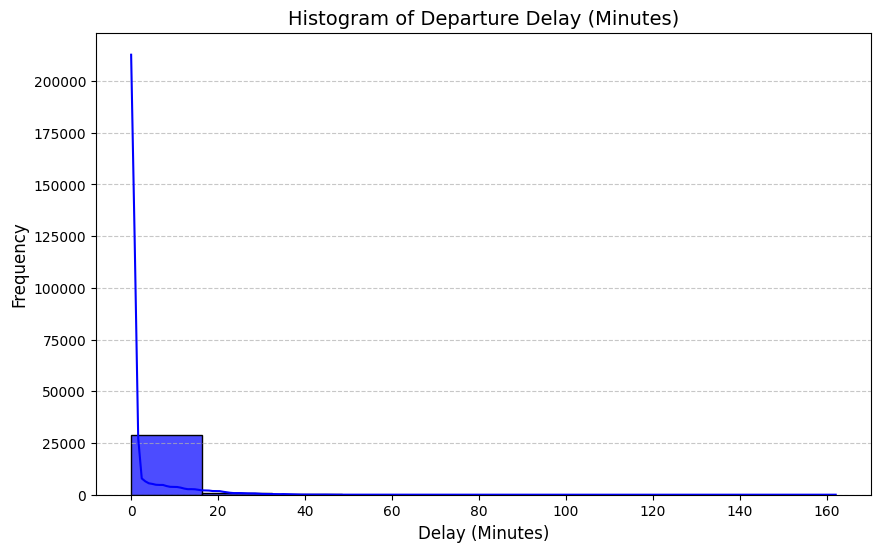

In [35]:

df = pd.read_csv('Merged_data.csv')

# Ensure departure_delay_minutes columns are numeric
delay_columns = ['departure_delay_minutes']
df[delay_columns] = df[delay_columns].apply(pd.to_numeric, errors='coerce')

# Visualization: Histogram of departure_delay_minutes durations (minutes)
plt.figure(figsize=(10, 6))
sns.histplot(df['departure_delay_minutes'], bins=10, kde=True, color='blue', alpha=0.7)
plt.title('Histogram of Departure Delay (Minutes)', fontsize=14)
plt.xlabel('Delay (Minutes)', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


# Temporal Analysis

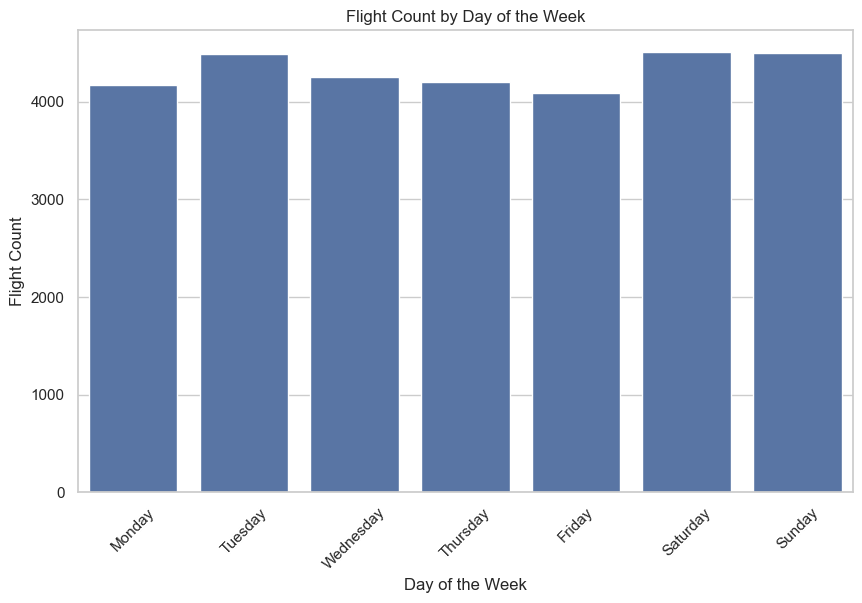

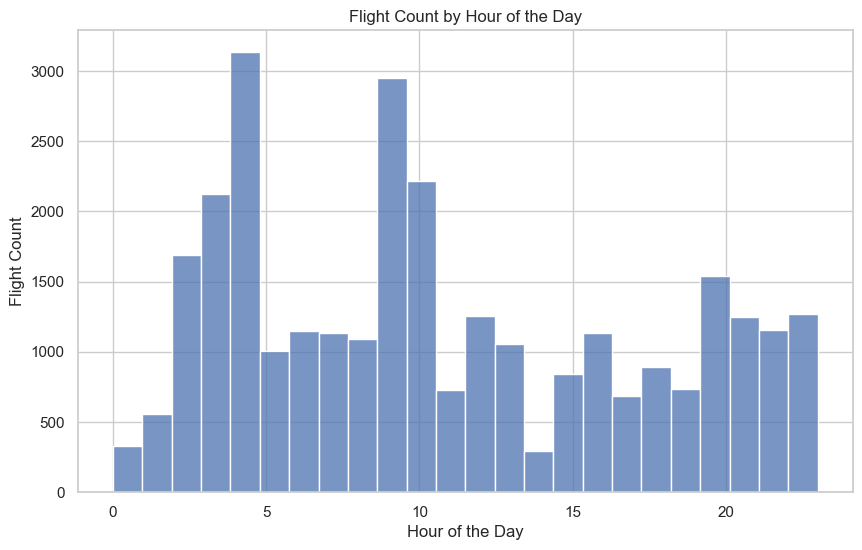

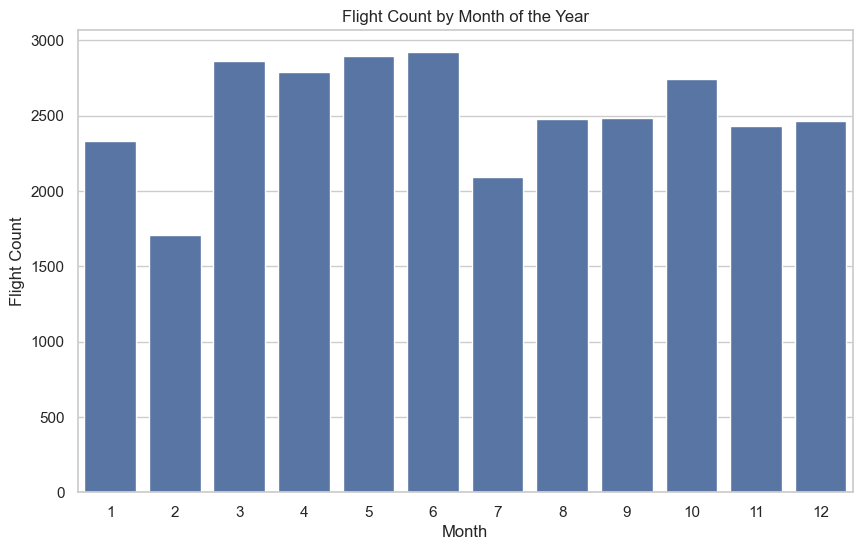

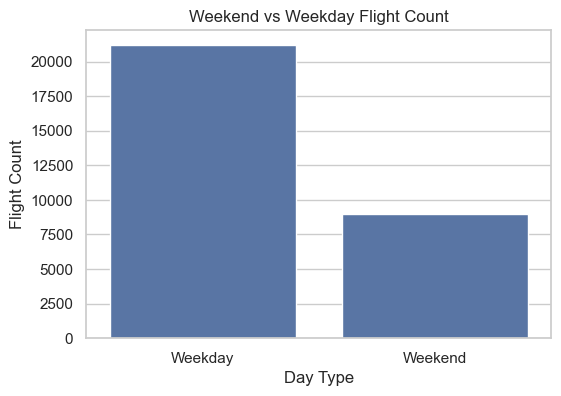

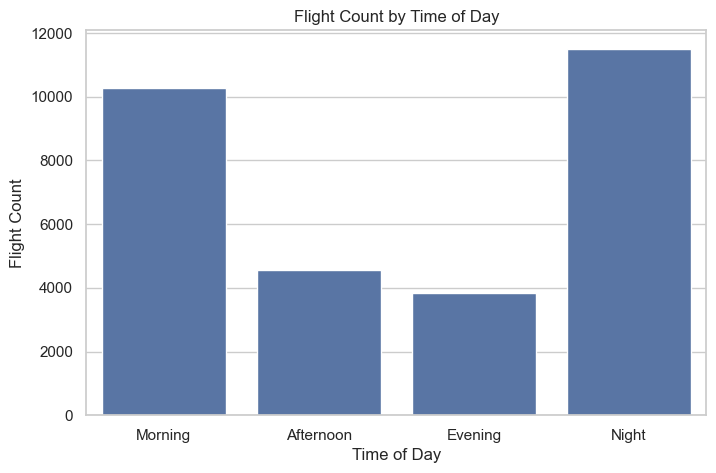

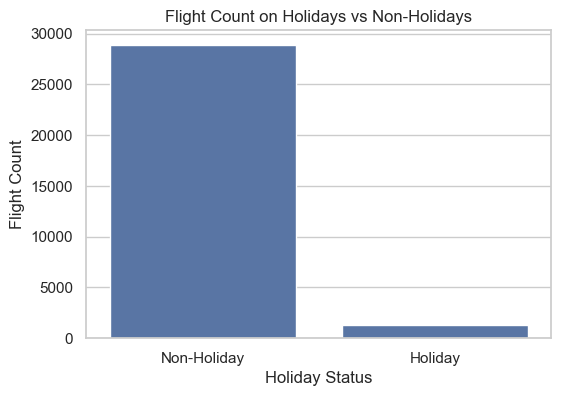

In [36]:

df_extra = pd.read_csv('Merged_data_extra_features.csv')

# Set visualization style
sns.set(style="whitegrid")

# Day of the Week Analysis
plt.figure(figsize=(10, 6))
sns.countplot(x='day_of_week', data=df_extra, order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
plt.title('Flight Count by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Flight Count')
plt.xticks(rotation=45)
plt.show()

# Hour of the Day Analysis
plt.figure(figsize=(10, 6))
sns.histplot(df_extra['hour_of_day'], bins=24, kde=False)
plt.title('Flight Count by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Flight Count')
plt.show()

# Month of the Year Analysis
plt.figure(figsize=(10, 6))
sns.countplot(x='month_of_year', data=df_extra, order=range(1, 13))
plt.title('Flight Count by Month of the Year')
plt.xlabel('Month')
plt.ylabel('Flight Count')
plt.show()

# Weekend vs. Weekday
plt.figure(figsize=(6, 4))
sns.countplot(x='is_weekend', data=df_extra)
plt.title('Weekend vs Weekday Flight Count')
plt.xticks([0, 1], ['Weekday', 'Weekend'])
plt.xlabel('Day Type')
plt.ylabel('Flight Count')
plt.show()

# Time of Day Analysis
plt.figure(figsize=(8, 5))
sns.countplot(x='time_of_day', data=df_extra, order=['Morning', 'Afternoon', 'Evening', 'Night'])
plt.title('Flight Count by Time of Day')
plt.xlabel('Time of Day')
plt.ylabel('Flight Count')
plt.show()

# Holiday Impact Analysis
plt.figure(figsize=(6, 4))
sns.countplot(x='is_holiday', data=df_extra)
plt.title('Flight Count on Holidays vs Non-Holidays')
plt.xticks([0, 1], ['Non-Holiday', 'Holiday'])
plt.xlabel('Holiday Status')
plt.ylabel('Flight Count')
plt.show()


# Delay Graphs

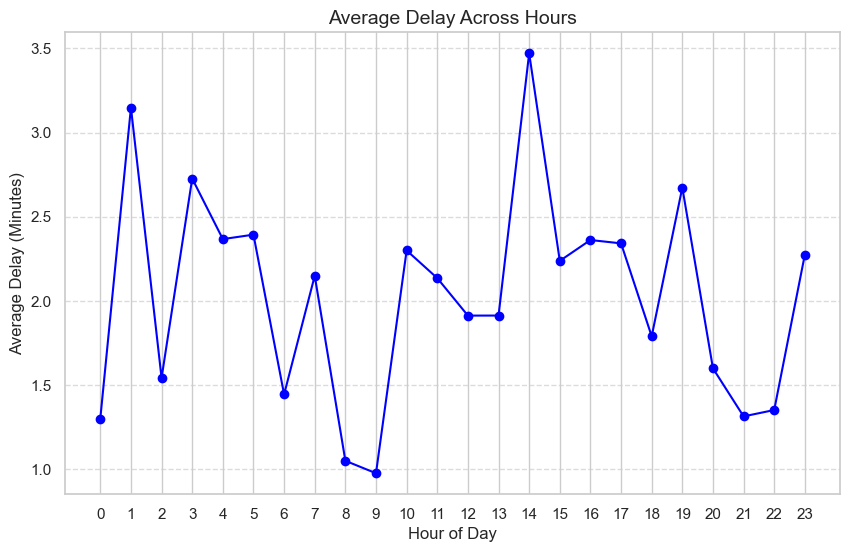

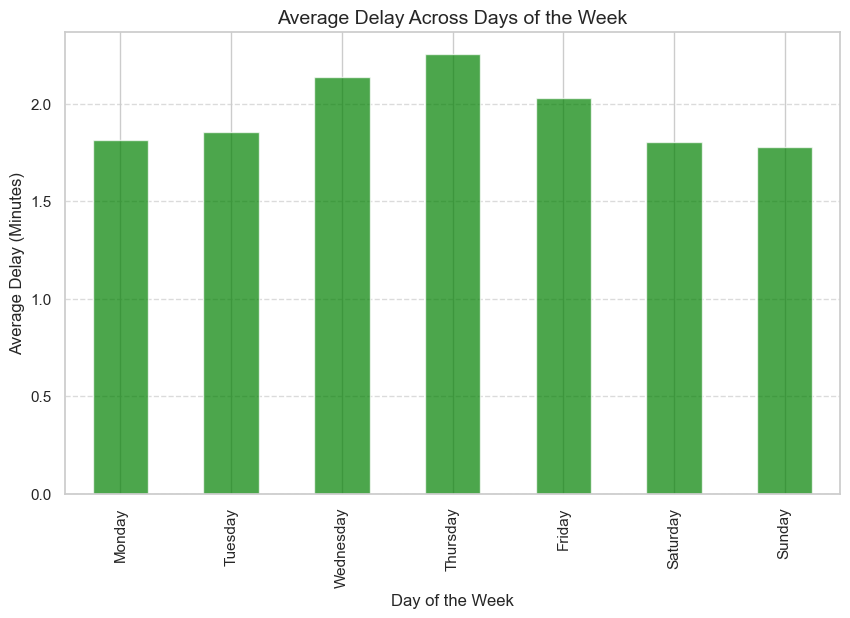

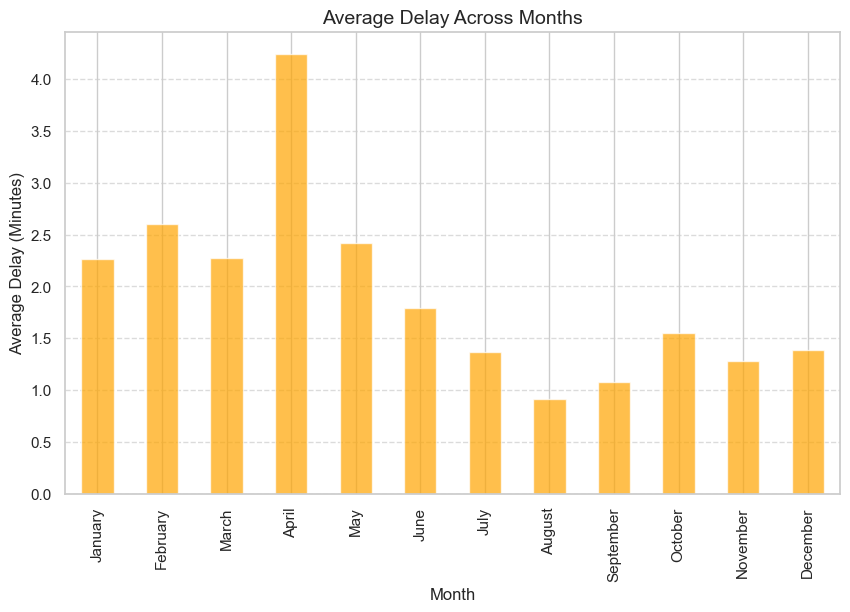

In [37]:
# Ensure datetime conversion
df_extra['departure_scheduledTime'] = pd.to_datetime(df_extra['departure_scheduledTime'], errors='coerce')

# Extract temporal features
df_extra['scheduled_hour_of_day'] = df_extra['departure_scheduledTime'].dt.hour
df_extra['scheduled_day_of_week'] = df_extra['departure_scheduledTime'].dt.day_name()
df_extra['scheduled_month'] = df_extra['departure_scheduledTime'].dt.month_name()


df_extra['departure_delay_minutes'] = pd.to_numeric(df_extra['departure_delay_minutes'], errors='coerce')

# Grouping delay data
hourly_delay = df_extra.groupby('scheduled_hour_of_day')['departure_delay_minutes'].mean()
daily_delay = df_extra.groupby('scheduled_day_of_week')['departure_delay_minutes'].mean()
monthly_delay = df_extra.groupby('scheduled_month')['departure_delay_minutes'].mean()

# Reorder days of the week
daily_delay = daily_delay.reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

# Reorder months
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
monthly_delay = monthly_delay.reindex(month_order)

plt.figure(figsize=(10, 6))
hourly_delay.plot(kind='line', marker='o', color='blue')
plt.title('Average Delay Across Hours', fontsize=14)
plt.xlabel('Hour of Day', fontsize=12)
plt.ylabel('Average Delay (Minutes)', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(range(24))  # Show all hours
plt.show()

plt.figure(figsize=(10, 6))
daily_delay.plot(kind='bar', color='green', alpha=0.7)
plt.title('Average Delay Across Days of the Week', fontsize=14)
plt.xlabel('Day of the Week', fontsize=12)
plt.ylabel('Average Delay (Minutes)', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

plt.figure(figsize=(10, 6))
monthly_delay.plot(kind='bar', color='orange', alpha=0.7)
plt.title('Average Delay Across Months', fontsize=14)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Average Delay (Minutes)', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()



# Category Wise Analysis

C:\Users\pc\AppData\Local\Temp\ipykernel_16536\2455833763.py:1: DtypeWarning: Columns (29) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('Merged_data_initial.csv')


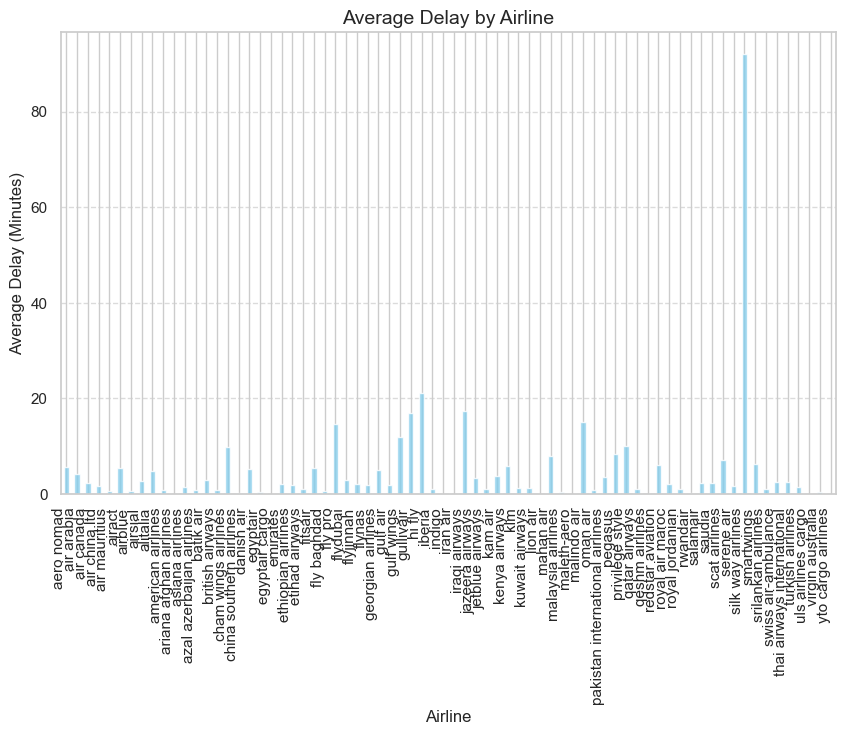

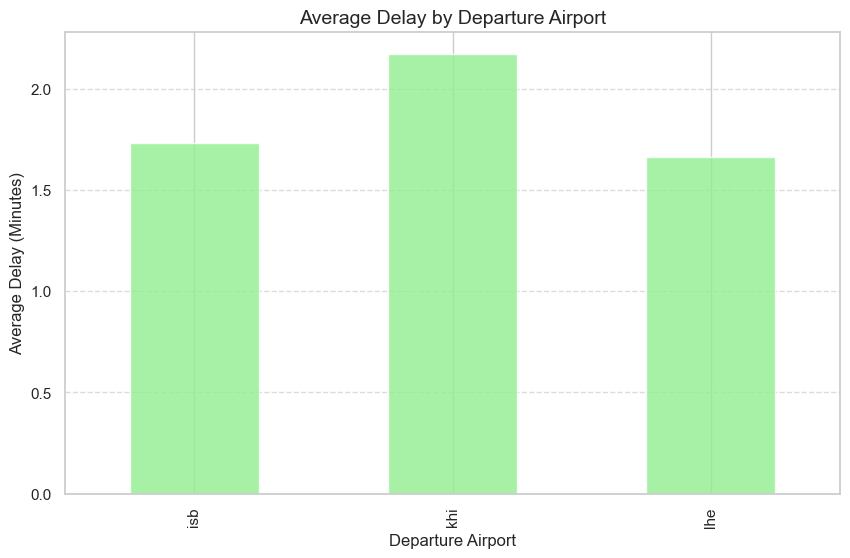

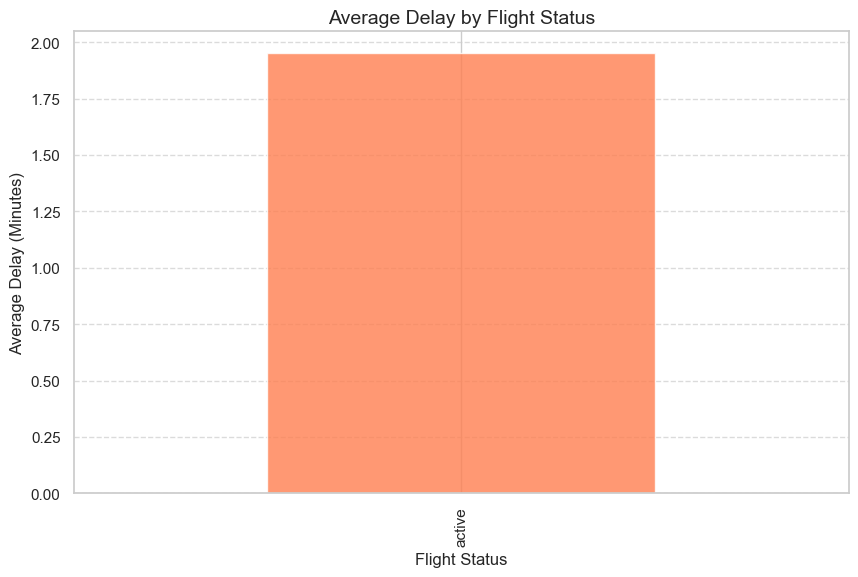

In [38]:

df = pd.read_csv('Merged_data_initial.csv')
df = df.dropna(subset=['arrival_estimatedTime'])
df['departure_delay_minutes'] = np.maximum( 0 , (pd.to_datetime(df['arrival_estimatedTime']) - pd.to_datetime(df['arrival_scheduledTime'])).dt.total_seconds() / 60 )


# Ensure departure_delay_minutes column is numeric
df['departure_delay_minutes'] = pd.to_numeric(df['departure_delay_minutes'], errors='coerce')

# Grouping data
airline_delay = df.groupby('airline_name')['departure_delay_minutes'].mean()
airport_delay = df.groupby('departure_iataCode')['departure_delay_minutes'].mean()
status_delay = df.groupby('status')['departure_delay_minutes'].mean()

# Plot: Bar chart for delays by airline
plt.figure(figsize=(10, 6))
airline_delay.plot(kind='bar', color='skyblue', alpha=0.8)
plt.title('Average Delay by Airline', fontsize=14)
plt.xlabel('Airline', fontsize=12)
plt.ylabel('Average Delay (Minutes)', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(rotation=90, ha='right')
plt.show()

# Plot: Bar chart for delays by departure airport
plt.figure(figsize=(10, 6))
airport_delay.plot(kind='bar', color='lightgreen', alpha=0.8)
plt.title('Average Delay by Departure Airport', fontsize=14)
plt.xlabel('Departure Airport', fontsize=12)
plt.ylabel('Average Delay (Minutes)', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Plot: Bar chart for delays by flight status
plt.figure(figsize=(10, 6))
status_delay.plot(kind='bar', color='coral', alpha=0.8)
plt.title('Average Delay by Flight Status', fontsize=14)
plt.xlabel('Flight Status', fontsize=12)
plt.ylabel('Average Delay (Minutes)', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


# Correlation Matrix

In [119]:
df = pd.read_csv('Merged_data.csv')
df

,departure_scheduledTime,Temperature_Max (°F),Temperature_Avg (°F),Temperature_Min (°F),Dew Point_Max (°F),Dew Point_Avg (°F),Dew Point_Min (°F),Humidity_Max (%),Humidity_Avg (%),Humidity_Min (%),...,airline_icaoCode_saz,airline_icaoCode_sep,airline_icaoCode_sif,airline_icaoCode_sva,airline_icaoCode_tha,airline_icaoCode_thy,airline_icaoCode_tvs,airline_icaoCode_uae,airline_icaoCode_voz,airline_icaoCode_vsv
0,28164770,95.0,88.2,82.0,81.0,79.8,77.0,89.0,76.0,63.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,28173570,93.0,86.9,81.0,82.0,78.9,75.0,100.0,77.4,59.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,28169925,97.0,87.3,82.0,82.0,78.2,75.0,89.0,74.3,60.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,28173810,88.0,82.9,75.0,79.0,77.1,73.0,100.0,83.7,70.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,28168435,95.0,86.6,79.0,79.0,75.8,73.0,83.0,71.2,56.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30203,28671055,82.0,78.0,73.0,75.0,73.2,70.0,100.0,85.9,74.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
30204,28663530,95.0,88.7,77.0,82.0,78.4,75.0,100.0,72.6,56.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
30205,28672440,91.0,85.3,79.0,79.0,76.7,73.0,94.0,76.5,63.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
30206,28663530,95.0,88.7,77.0,82.0,78.4,75.0,100.0,72.6,56.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [120]:
df_numerical = df.select_dtypes(include=['float64', 'int64']) # Get only Numerical data

In [121]:
df_numerical

,departure_scheduledTime,Temperature_Max (°F),Temperature_Avg (°F),Temperature_Min (°F),Dew Point_Max (°F),Dew Point_Avg (°F),Dew Point_Min (°F),Humidity_Max (%),Humidity_Avg (%),Humidity_Min (%),...,airline_icaoCode_saz,airline_icaoCode_sep,airline_icaoCode_sif,airline_icaoCode_sva,airline_icaoCode_tha,airline_icaoCode_thy,airline_icaoCode_tvs,airline_icaoCode_uae,airline_icaoCode_voz,airline_icaoCode_vsv
0,28164770,95.0,88.2,82.0,81.0,79.8,77.0,89.0,76.0,63.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,28173570,93.0,86.9,81.0,82.0,78.9,75.0,100.0,77.4,59.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,28169925,97.0,87.3,82.0,82.0,78.2,75.0,89.0,74.3,60.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,28173810,88.0,82.9,75.0,79.0,77.1,73.0,100.0,83.7,70.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,28168435,95.0,86.6,79.0,79.0,75.8,73.0,83.0,71.2,56.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30203,28671055,82.0,78.0,73.0,75.0,73.2,70.0,100.0,85.9,74.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
30204,28663530,95.0,88.7,77.0,82.0,78.4,75.0,100.0,72.6,56.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
30205,28672440,91.0,85.3,79.0,79.0,76.7,73.0,94.0,76.5,63.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
30206,28663530,95.0,88.7,77.0,82.0,78.4,75.0,100.0,72.6,56.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [122]:
correlation_matrix = df_numerical.corr()    # Get Correlation Matrix

# HeatMap

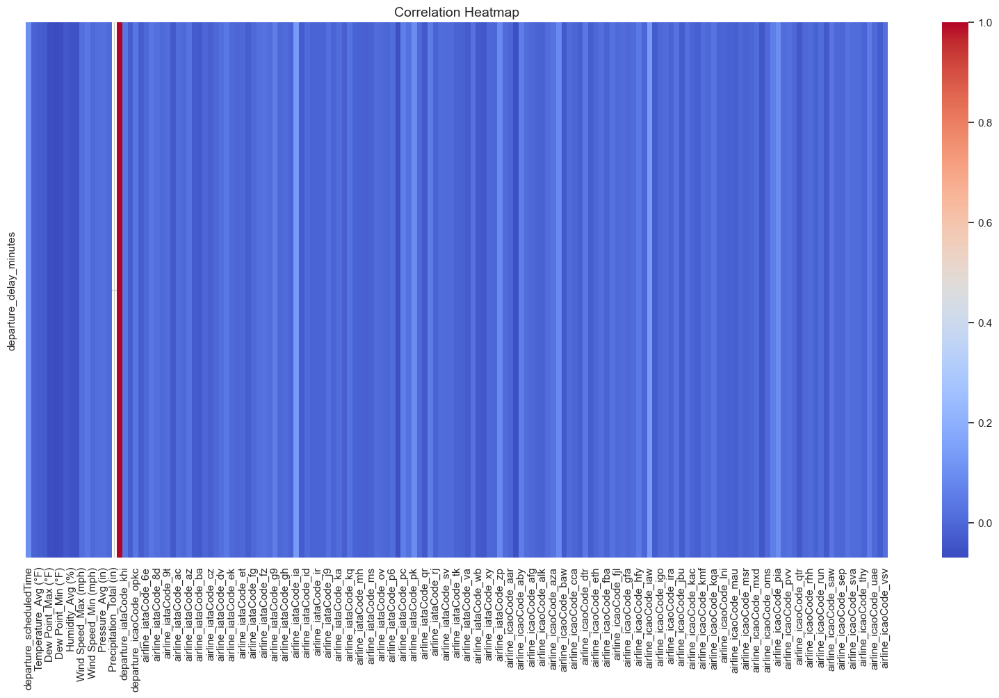

In [123]:
plt.figure(figsize=(20, 10))
sns.heatmap(correlation_matrix["departure_delay_minutes"].to_frame().T, cmap='coolwarm')
plt.title('Correlation Heatmap', fontsize=14)
plt.show()

# Cluster Map

d:\D-Program Files\Python\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
d:\D-Program Files\Python\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


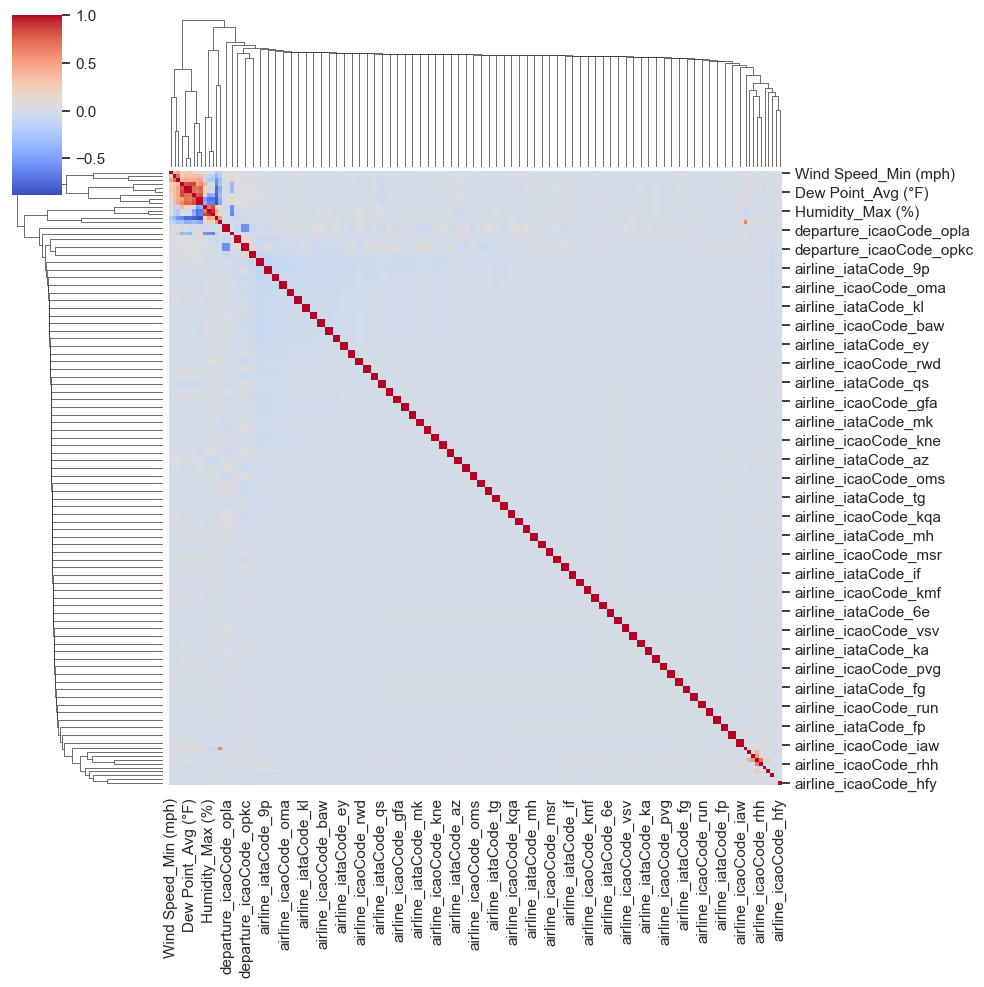

In [143]:

corr_matrix_filled = correlation_matrix.fillna(0)

sns.clustermap(corr_matrix_filled, cmap='coolwarm')

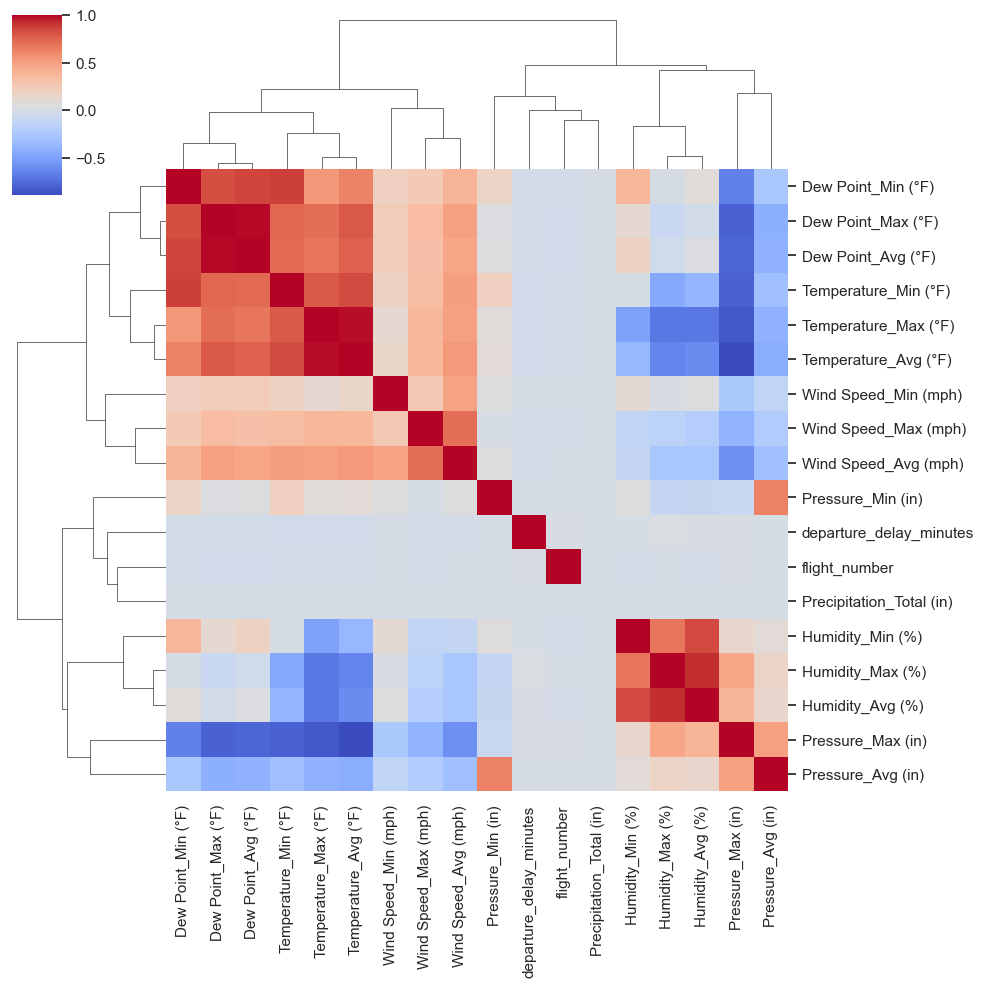

In [ ]:

# Subset of Correlation Matrix
corr_matrix_filled = correlation_matrix.fillna(0)

sns.clustermap(corr_matrix_filled, cmap='coolwarm')

# PairPlot

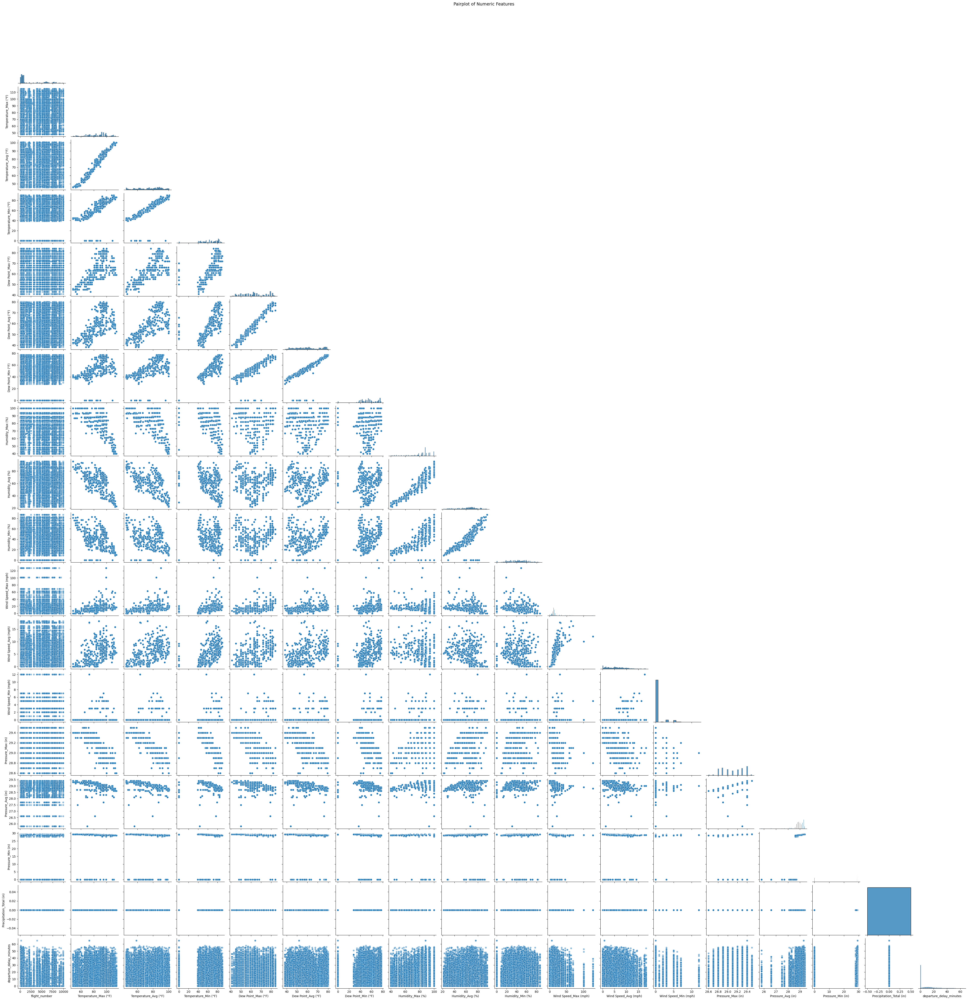

In [ ]:

# Select numeric columns
numeric_cols = df_numerical.columns

# Pairplot
sns.pairplot(df_numerical[numeric_cols], corner=True, plot_kws={'alpha': 0.5})
plt.suptitle('Pairplot of Numeric Features', fontsize=14, y=1.02)
plt.show()


# Scatter plot

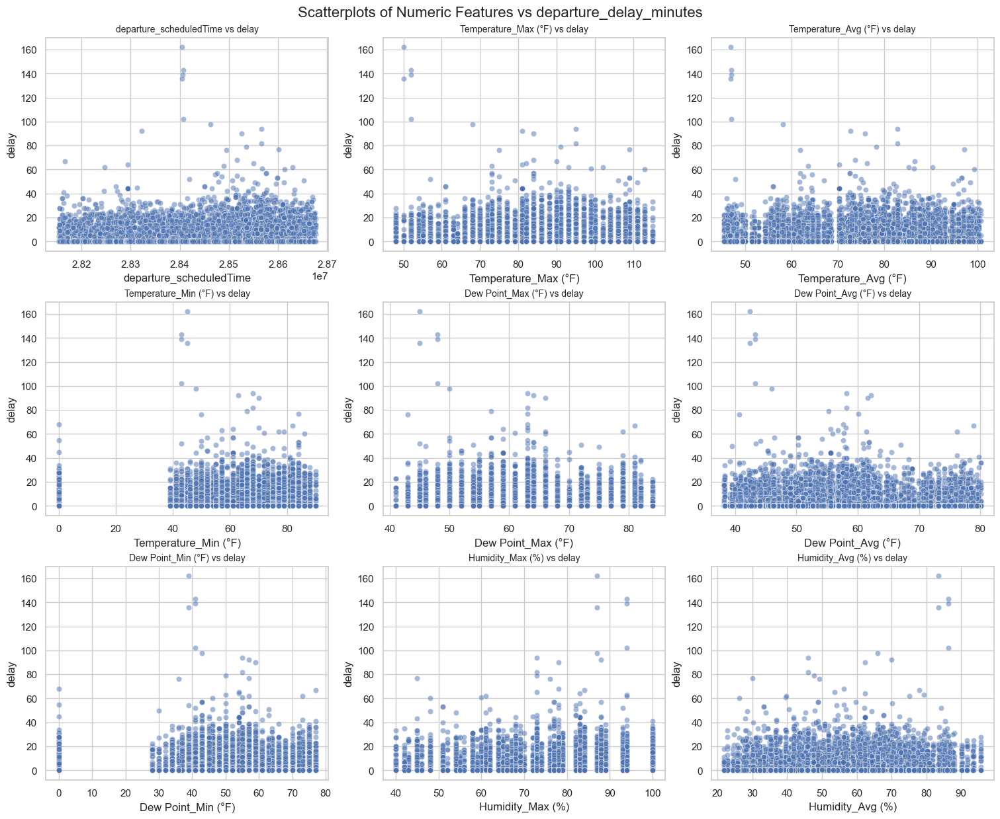

In [159]:

numeric_cols = [col for col in df_numerical.columns if col != 'departure_delay_minutes']
n_cols = 3  
n_rows = 3

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4), constrained_layout=True)

axes = axes.flatten()

# Only show some cols as most are not correlated
count = 0
for i, col in enumerate(numeric_cols):
    sns.scatterplot(x=df_numerical[col], y=df_numerical['departure_delay_minutes'], alpha=0.5, ax=axes[i])
    axes[i].set_title(f'{col} vs delay', fontsize=10)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('delay')

    count+=1
    if count >= 9:
        break

count = 0
for j in range(len(numeric_cols), len(axes)):
    axes[j].axis('off')
    count+=1
    if count >= 9:
        break

fig.suptitle('Scatterplots of Numeric Features vs departure_delay_minutes', fontsize=16, y=1.02)

plt.show()

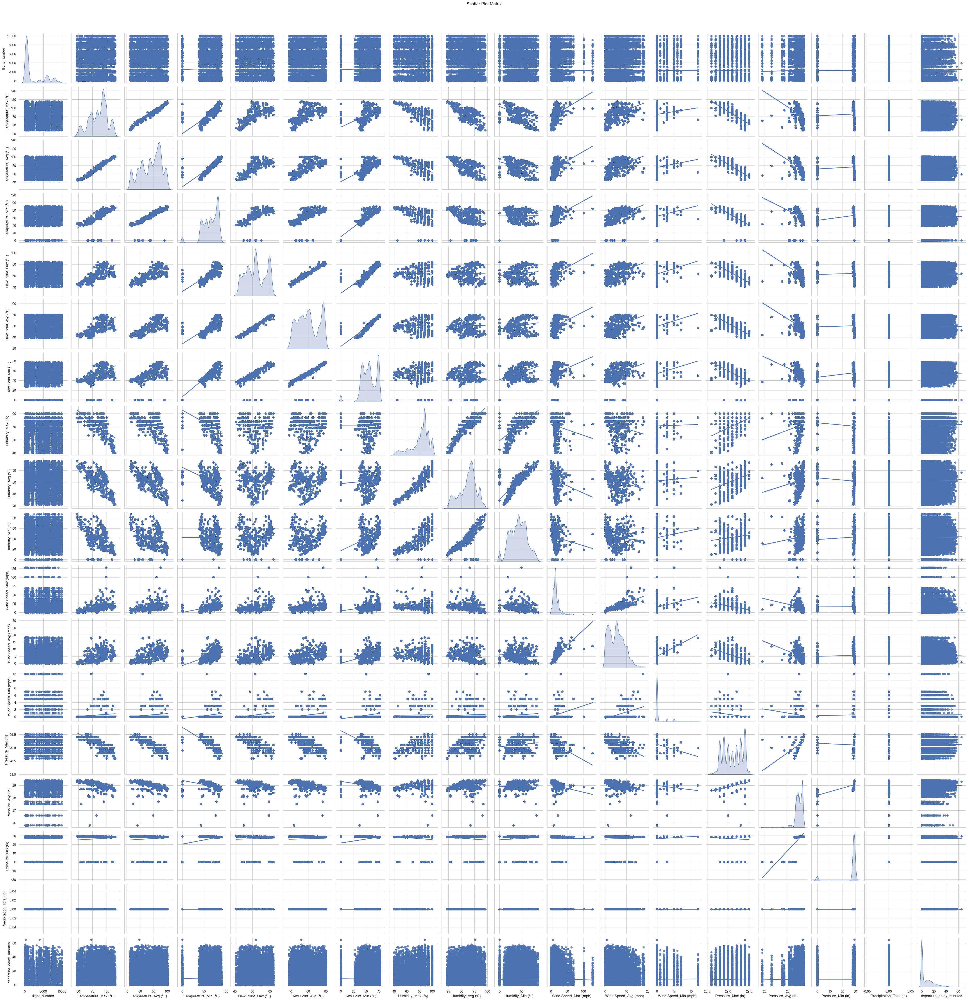

In [ ]:
### 3. Scatter Plot Matrix
sns.pairplot(df_numerical, diag_kind='kde', kind='reg')
plt.suptitle('Scatter Plot Matrix', y=1.02, fontsize=14)
plt.show()

# Get N Best Features

In [124]:
# Find the 5 columns with the highest absolute correlations and their values
target_column = 'departure_delay_minutes'
correlations = correlation_matrix[target_column].drop(target_column)

top_n_features = correlations.abs().nlargest(10).index
top_n_values = correlations[top_n_features]

top_n_features = list(top_n_features)

# Display results
top_n_results = pd.DataFrame({'Column': top_n_features, 'Correlation': top_n_values})
top_n_features.append("departure_delay_minutes")
top_n_results

,Column,Correlation
airline_iataCode_ia,airline_iataCode_ia,0.132770
airline_icaoCode_iaw,airline_icaoCode_iaw,0.132770
departure_scheduledTime,departure_scheduledTime,0.100254
airline_iataCode_pk,airline_iataCode_pk,0.097365
airline_icaoCode_pia,airline_icaoCode_pia,0.097365
airline_iataCode_zp,airline_iataCode_zp,0.086711
airline_icaoCode_azq,airline_icaoCode_azq,0.086711
Dew Point_Avg (°F),Dew Point_Avg (°F),-0.068747
Dew Point_Max (°F),Dew Point_Max (°F),-0.062055
Dew Point_Min (°F),Dew Point_Min (°F),-0.061282


# Comparing Delay in train and test

In [45]:
df_train = pd.read_csv("Merged_data.csv")
df_test = pd.read_csv('Merged_data_test.csv')

In [46]:
df_test

,departure_scheduledTime,Temperature_Max (°F),Temperature_Avg (°F),Temperature_Min (°F),Dew Point_Max (°F),Dew Point_Avg (°F),Dew Point_Min (°F),Humidity_Max (%),Humidity_Avg (%),Humidity_Min (%),...,airline_icaoCode_sep,airline_icaoCode_sif,airline_icaoCode_smr,airline_icaoCode_sva,airline_icaoCode_tha,airline_icaoCode_thy,airline_icaoCode_tvs,airline_icaoCode_uae,airline_icaoCode_voz,airline_icaoCode_vsv
0,28160435,95.0,88.6,82.0,81.0,78.1,75.0,89.0,71.3,59.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,28174080,88.0,82.9,75.0,79.0,77.1,73.0,100.0,83.7,70.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,28174080,88.0,82.9,75.0,79.0,77.1,73.0,100.0,83.7,70.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,28176045,93.0,86.3,81.0,79.0,76.7,75.0,89.0,73.8,59.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,28162335,90.0,84.4,81.0,81.0,79.8,77.0,100.0,85.3,75.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14905,28672860,91.0,85.3,79.0,79.0,76.7,73.0,94.0,76.5,63.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14906,28664270,95.0,88.7,77.0,82.0,78.4,75.0,100.0,72.6,56.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14907,28669560,93.0,85.8,75.0,82.0,77.0,72.0,100.0,75.0,63.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14908,28675290,99.0,91.4,82.0,79.0,77.3,75.0,84.0,64.5,47.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


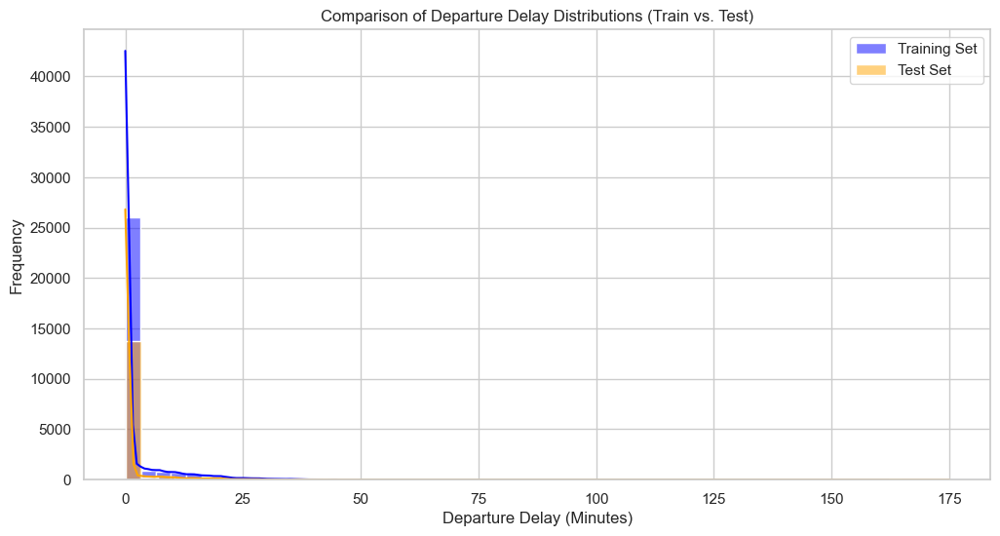

In [47]:
plt.figure(figsize=(12, 6))

# Histogram for training and test data
sns.histplot(df_train['departure_delay_minutes'], color='blue', label='Training Set', kde=True, bins=50, alpha=0.5)
sns.histplot(df_test['departure_delay_minutes'], color='orange', label='Test Set', kde=True, bins=50, alpha=0.5)

plt.title('Comparison of Departure Delay Distributions (Train vs. Test)')
plt.xlabel('Departure Delay (Minutes)')
plt.ylabel('Frequency')
plt.legend()
plt.show()

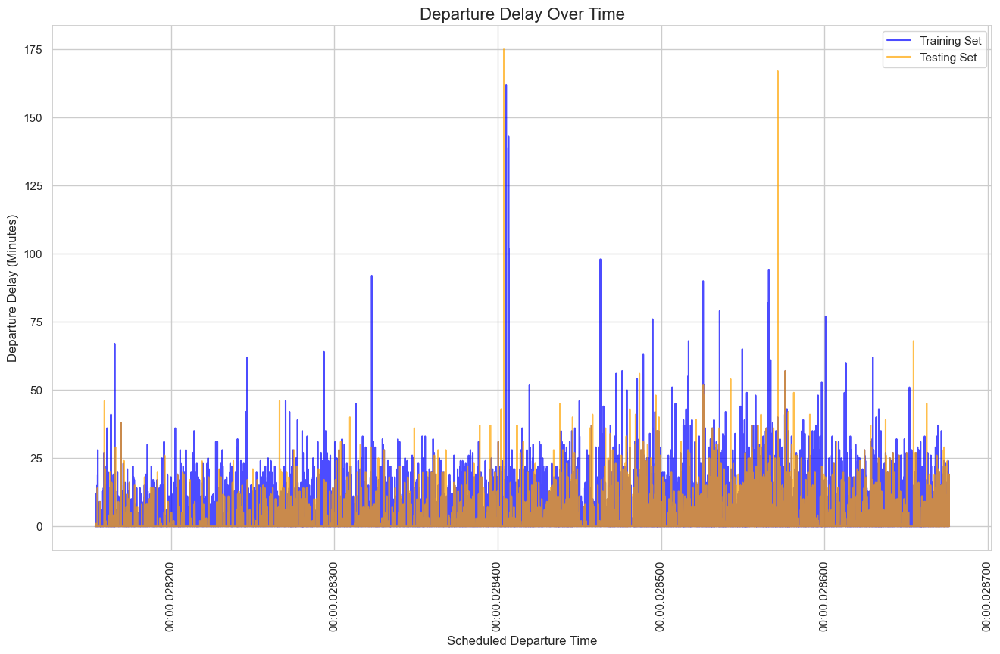

In [48]:

df_train['departure_scheduledTime'] = pd.to_datetime(df_train['departure_scheduledTime'])
df_test['departure_scheduledTime'] = pd.to_datetime(df_test['departure_scheduledTime'])

# Sorting for smoother lines
df_train = df_train.sort_values(by='departure_scheduledTime')
df_test = df_test.sort_values(by='departure_scheduledTime')

plt.figure(figsize=(16, 9))
plt.plot( df_train['departure_scheduledTime'], df_train['departure_delay_minutes'], label='Training Set', color='blue', alpha=0.7 )
plt.plot( df_test['departure_scheduledTime'], df_test['departure_delay_minutes'], label='Testing Set', color='orange', alpha=0.7 )

plt.title('Departure Delay Over Time', fontsize=16)
plt.xlabel('Scheduled Departure Time', fontsize=12)
plt.ylabel('Departure Delay (Minutes)', fontsize=12)
plt.legend()
plt.grid(True)
plt.xticks(rotation=90)

plt.show()


# Model Training and Evaluation

In [125]:

df_train = pd.read_csv('Merged_data.csv')
df_test = pd.read_csv('Merged_data_test.csv')

# Preprocessing for training
df_test.drop(columns='departure_delay_minutes')

df_train = df_train[top_n_features]
df_test = df_test[top_n_features]


In [126]:
df_train

,airline_iataCode_ia,airline_icaoCode_iaw,departure_scheduledTime,airline_iataCode_pk,airline_icaoCode_pia,airline_iataCode_zp,airline_icaoCode_azq,Dew Point_Avg (°F),Dew Point_Max (°F),Dew Point_Min (°F),departure_delay_minutes
0,0.0,0.0,28164770,0.0,0.0,0.0,0.0,79.8,81.0,77.0,0.0
1,0.0,0.0,28173570,1.0,1.0,0.0,0.0,78.9,82.0,75.0,0.0
2,0.0,0.0,28169925,0.0,0.0,0.0,0.0,78.2,82.0,75.0,0.0
3,0.0,0.0,28173810,0.0,0.0,0.0,0.0,77.1,79.0,73.0,0.0
4,0.0,0.0,28168435,0.0,0.0,0.0,0.0,75.8,79.0,73.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
30203,0.0,0.0,28671055,0.0,0.0,0.0,0.0,73.2,75.0,70.0,0.0
30204,0.0,0.0,28663530,1.0,1.0,0.0,0.0,78.4,82.0,75.0,0.0
30205,0.0,0.0,28672440,0.0,0.0,0.0,0.0,76.7,79.0,73.0,0.0
30206,0.0,0.0,28663530,0.0,0.0,0.0,0.0,78.4,82.0,75.0,0.0


In [127]:
df_test

,airline_iataCode_ia,airline_icaoCode_iaw,departure_scheduledTime,airline_iataCode_pk,airline_icaoCode_pia,airline_iataCode_zp,airline_icaoCode_azq,Dew Point_Avg (°F),Dew Point_Max (°F),Dew Point_Min (°F),departure_delay_minutes
0,0.0,0.0,28160435,0.0,0.0,0.0,0.0,78.1,81.0,75.0,0.0
1,0.0,0.0,28174080,1.0,1.0,0.0,0.0,77.1,79.0,73.0,0.0
2,0.0,0.0,28174080,0.0,0.0,0.0,0.0,77.1,79.0,73.0,0.0
3,0.0,0.0,28176045,0.0,0.0,0.0,0.0,76.7,79.0,75.0,0.0
4,0.0,0.0,28162335,0.0,0.0,0.0,0.0,79.8,81.0,77.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
14905,0.0,0.0,28672860,0.0,0.0,0.0,0.0,76.7,79.0,73.0,0.0
14906,0.0,0.0,28664270,0.0,0.0,0.0,0.0,78.4,82.0,75.0,0.0
14907,0.0,0.0,28669560,0.0,0.0,0.0,0.0,77.0,82.0,72.0,0.0
14908,0.0,0.0,28675290,0.0,0.0,0.0,0.0,77.3,79.0,75.0,0.0


# Data Preprocessing for Training

In [128]:
# Convert Delay To Binary
df_train['delay_status'] = (df_train['departure_delay_minutes'] > 0).astype(int)

X = df_train.drop(columns='delay_status')
y = df_train['delay_status']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ensure all required columns are present in the test dataset
missing_columns = set(X_train.columns) - set(df_test.columns)
for col in missing_columns:
    df_test[col] = 0  

# Ensure column order matches
df_test = df_test[X_train.columns]
df_train = df_train.dropna()

In [129]:
df_train

,airline_iataCode_ia,airline_icaoCode_iaw,departure_scheduledTime,airline_iataCode_pk,airline_icaoCode_pia,airline_iataCode_zp,airline_icaoCode_azq,Dew Point_Avg (°F),Dew Point_Max (°F),Dew Point_Min (°F),departure_delay_minutes,delay_status
0,0.0,0.0,28164770,0.0,0.0,0.0,0.0,79.8,81.0,77.0,0.0,0
1,0.0,0.0,28173570,1.0,1.0,0.0,0.0,78.9,82.0,75.0,0.0,0
2,0.0,0.0,28169925,0.0,0.0,0.0,0.0,78.2,82.0,75.0,0.0,0
3,0.0,0.0,28173810,0.0,0.0,0.0,0.0,77.1,79.0,73.0,0.0,0
4,0.0,0.0,28168435,0.0,0.0,0.0,0.0,75.8,79.0,73.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
30203,0.0,0.0,28671055,0.0,0.0,0.0,0.0,73.2,75.0,70.0,0.0,0
30204,0.0,0.0,28663530,1.0,1.0,0.0,0.0,78.4,82.0,75.0,0.0,0
30205,0.0,0.0,28672440,0.0,0.0,0.0,0.0,76.7,79.0,73.0,0.0,0
30206,0.0,0.0,28663530,0.0,0.0,0.0,0.0,78.4,82.0,75.0,0.0,0


# Binary Classification Training Via Logistic Regression

In [130]:


model_lr = LogisticRegression(max_iter=1000, random_state=42)

X = df_train.drop(columns=['delay_status'])
y = df_train['delay_status']

X = X[top_n_features[:-1]]

# Splitting data for train test
X_train, X_val, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Making sure to select only numerical columns and using only required cols
X_test = df_test[top_n_features[:-1]]

model_lr.fit(X_train, y_train)
yp = model_lr.predict(X_val)




Accuracy: 0.8224
Precision: 0.4112
Recall: 0.5000
F1-Score: 0.4513

Class-wise Precision and Recall:
              precision    recall  f1-score   support

     Class 0       0.82      1.00      0.90      4969
     Class 1       0.00      0.00      0.00      1073

    accuracy                           0.82      6042
   macro avg       0.41      0.50      0.45      6042
weighted avg       0.68      0.82      0.74      6042


Confusion Matrix:
[[4969    0]
 [1073    0]]


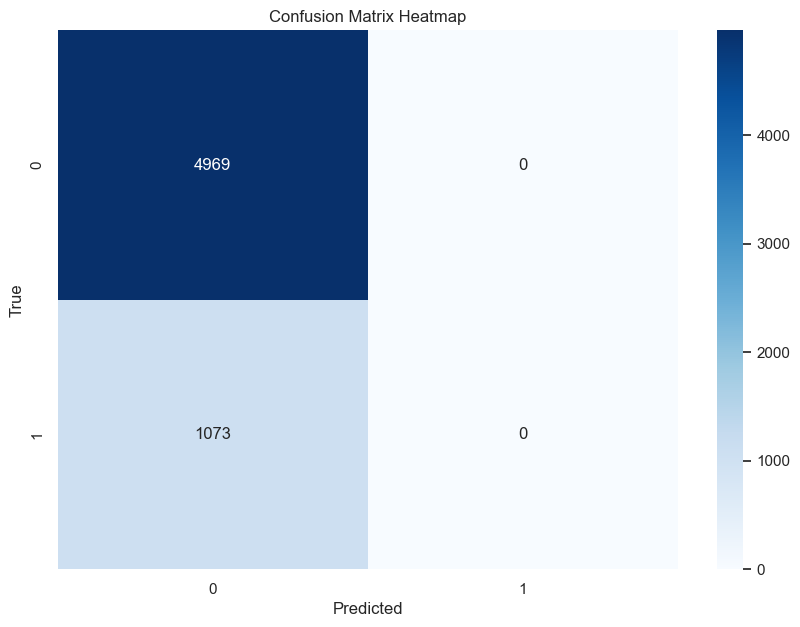

In [131]:
get_evaluations(y_test, yp)

In [132]:
X_train.head()

,airline_iataCode_ia,airline_icaoCode_iaw,departure_scheduledTime,airline_iataCode_pk,airline_icaoCode_pia,airline_iataCode_zp,airline_icaoCode_azq,Dew Point_Avg (°F),Dew Point_Max (°F),Dew Point_Min (°F)
7916,0.0,0.0,28162960,0.0,0.0,0.0,0.0,79.8,81.0,77.0
18242,0.0,0.0,28539655,0.0,0.0,0.0,0.0,49.0,57.0,41.0
28758,0.0,0.0,28558595,0.0,0.0,0.0,0.0,61.8,66.0,59.0
28284,0.0,0.0,28552820,0.0,0.0,0.0,0.0,61.7,75.0,59.0
13730,0.0,0.0,28362760,0.0,0.0,0.0,0.0,52.9,55.0,52.0


# Kaggle Submission

In [133]:

# Preparing for Kaggle Submission

# yp_bin = model_lr.predict(X_test.drop(columns='departure_delay_minutes'))
yp_bin = model_lr.predict(X_test)

yp_bin_classes = ['on-time' if pred == 0 else 'delayed' for pred in yp_bin]



In [134]:
bin_kaggle_submission = pd.DataFrame({ 'ID': range(1, len(yp_bin_classes[:12914]) + 1),  'Delay': yp_bin_classes[12914] })
bin_kaggle_submission.to_csv('i220472_Binary_Classifcation.csv', index=False)


# Optimization and Cross Validation

In [135]:
X_train

,airline_iataCode_ia,airline_icaoCode_iaw,departure_scheduledTime,airline_iataCode_pk,airline_icaoCode_pia,airline_iataCode_zp,airline_icaoCode_azq,Dew Point_Avg (°F),Dew Point_Max (°F),Dew Point_Min (°F)
7916,0.0,0.0,28162960,0.0,0.0,0.0,0.0,79.8,81.0,77.0
18242,0.0,0.0,28539655,0.0,0.0,0.0,0.0,49.0,57.0,41.0
28758,0.0,0.0,28558595,0.0,0.0,0.0,0.0,61.8,66.0,59.0
28284,0.0,0.0,28552820,0.0,0.0,0.0,0.0,61.7,75.0,59.0
13730,0.0,0.0,28362760,0.0,0.0,0.0,0.0,52.9,55.0,52.0
...,...,...,...,...,...,...,...,...,...,...
29802,0.0,0.0,28650990,0.0,0.0,0.0,0.0,69.9,73.0,66.0
5390,0.0,0.0,28558355,0.0,0.0,0.0,0.0,61.8,66.0,59.0
860,0.0,0.0,28229970,0.0,0.0,0.0,0.0,73.3,79.0,68.0
15795,0.0,0.0,28439540,0.0,0.0,0.0,0.0,44.9,48.0,41.0


# Using Custom Built Logistic Regression

In [54]:

class LogisticRegression_custom:
    def __init__(self):
        self.theta = None

    def sigmoid(self, X):
        return 1 / (1 + np.exp(-X))

    def hypothesis(self, X):
        return self.sigmoid(X.dot(self.theta))

    def cost_function(self, X, y):
        predictions = self.hypothesis(X)
        m = len(y)
        
        # Clip predictions to avoid log(0) or log(1)
        predictions = np.clip(predictions, 1e-10, 1 - 1e-10)
        
        cost = - (1 / m) * np.sum(y * np.log(predictions) + (1 - y) * np.log(1 - predictions))
        return cost

    def gradient(self, X, y):
        predictions = self.hypothesis(X)
        errors = predictions - y
        m = len(y)
        grad = (1 / m) * X.T.dot(errors)
        return grad

    def gradient_descent(self, X, y, learning_rate, iterations):
        m, n = X.shape
        self.theta = np.zeros(n)

        for i in range(iterations):
            grad = self.gradient(X, y)
            self.theta -= learning_rate * grad
            if i % 100 == 0:
                cost = self.cost_function(X, y)
                print(f"Iteration {i} : {cost}")
                # If cost is NaN, stop early to prevent further issues
                if np.isnan(cost):
                    print("Cost function returned NaN. Stopping early.")
                    break

    def train(self, X, y, learning_rate=0.01, iterations=1000):
        X = np.hstack([X, np.ones((X.shape[0], 1))])  # Add bias term
        self.gradient_descent(X, y, learning_rate, iterations)

    def predict_proba(self, X):
        X = np.hstack([X, np.ones((X.shape[0], 1))])  # Add bias term
        return self.hypothesis(X)

    def predict(self, X):
        return self.predict_proba(X) >= 0.5

    def plot(self, X, y):
        if X.shape[1] != 1:
            raise ValueError("Plotting is only supported for a single feature.")

        plt.scatter(X, y, color='blue', label='Data Points')
        x_line = np.linspace(min(X), max(X), 100).reshape(-1, 1)
        y_line = self.predict_proba(x_line)
        plt.plot(x_line, y_line, color='red', label='Regression Line')
        plt.xlabel('Feature')
        plt.ylabel('Target')
        plt.legend()
        plt.show()



In [ ]:

nfolds=4 # lets use four folds..
folds=generate_folds(np.array(X_train),np.array(y_train),nfolds)

#Lets perform the grid search...
lrs=np.linspace(0.1,0.00001,13) # You can also search over depth as well....
best_lr=None
best_acc = 0

for lr in lrs:                   
    totacc=[]
    for k in range(nfolds):
        dt=LogisticRegression_custom()
        dt.train(folds[k][0],folds[k][1], learning_rate=lr, iterations=1000)
        pclasses=dt.predict(folds[k][2])
        acc=np.sum(pclasses==folds[k][3])/float(folds[k][3].shape[0])
        print ("[Info] Fold {} Accuracy = {}".format(k+1, acc))
        totacc.append(acc)
    
    mean_acc = np.mean(totacc)

    print (totacc, '\nMean Accuracy ={}'.format(mean_acc))

    if best_acc < mean_acc:
        best_acc = acc
        best_lr = lr

print ("Best Learning Rate = ", best_lr, "Accuracy = ", best_acc)

Generating CV data for 2 classes
Iteration 0 : 7.704056937695816
Iteration 100 : 15.32179396466113
Iteration 200 : 7.702583341317496


C:\Users\pc\AppData\Local\Temp\ipykernel_7604\2779089127.py:6: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-X))


Iteration 300 : 8.14957516113532
Iteration 400 : 7.785274993251792
Iteration 500 : 7.704056937695816
Iteration 600 : 7.928834915762087
Iteration 700 : 8.12431427730577
Iteration 800 : 7.704056937695816
Iteration 900 : 15.253333301960064
[Info] Fold 1 Accuracy = 0.6654062439402754
Iteration 0 : 7.704056937695816
Iteration 100 : 6.8328424711013245
Iteration 200 : 7.7112914466022735
Iteration 300 : 10.014218506735618
Iteration 400 : 7.6889944342189676
Iteration 500 : 7.676301844073948
Iteration 600 : 8.163298369136509
Iteration 700 : 7.704056937695816
Iteration 800 : 15.182016355094774
Iteration 900 : 7.348342387289845
[Info] Fold 2 Accuracy = 0.33779329067287184
Iteration 0 : 7.704056937695816
Iteration 100 : 7.705765206584821
Iteration 200 : 7.715461814851731
Iteration 300 : 7.704056937695816
Iteration 400 : 13.12395673305803
Iteration 500 : 10.303849989849065
Iteration 600 : 7.704056937695816
Iteration 700 : 8.591927951839278
Iteration 800 : 7.704056937695816
Iteration 900 : 7.27260680

In [ ]:

model_lr = LogisticRegression_custom()

model_lr.train(X_train, y_train, learning_rate=best_lr, iterations=1000)

yp_bin = model_lr.predict(X_test)

yp_bin_classes = ['on-time' if pred == 0 else 'delayed' for pred in yp_bin]



Iteration 0 : 7.704119182138677
Iteration 100 : 7.704119182138677


C:\Users\pc\AppData\Local\Temp\ipykernel_7604\2779089127.py:6: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-X))
C:\Users\pc\AppData\Local\Temp\ipykernel_7604\2779089127.py:6: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-X))


Iteration 200 : 7.713384161980906
Iteration 300 : 7.704119182138677


C:\Users\pc\AppData\Local\Temp\ipykernel_7604\2779089127.py:6: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-X))
C:\Users\pc\AppData\Local\Temp\ipykernel_7604\2779089127.py:6: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-X))


Iteration 400 : 15.321731720218041
Iteration 500 : 14.020424394045385
Iteration 600 : 8.685872421892679


C:\Users\pc\AppData\Local\Temp\ipykernel_7604\2779089127.py:6: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-X))
C:\Users\pc\AppData\Local\Temp\ipykernel_7604\2779089127.py:6: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-X))
C:\Users\pc\AppData\Local\Temp\ipykernel_7604\2779089127.py:6: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-X))


Iteration 700 : 7.704119182138677
Iteration 800 : 7.704119182138677
Iteration 900 : 7.934405454639876


C:\Users\pc\AppData\Local\Temp\ipykernel_7604\2779089127.py:6: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-X))
C:\Users\pc\AppData\Local\Temp\ipykernel_7604\2779089127.py:6: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-X))
C:\Users\pc\AppData\Local\Temp\ipykernel_7604\2779089127.py:6: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-X))


In [57]:
custom_kaggle_submission = pd.DataFrame({ 'ID': range(1, len(yp_bin_classes[:12914]) + 1), 'Delay': yp_bin_classes[12914] })

custom_kaggle_submission.to_csv('i220472_Binary_Classifcation_custom.csv', index=False)


# Multi-Class Classification

In [136]:

# * Columns to Choose
features = top_n_features

In [137]:
multi_df = df_train.copy()
multi_df = multi_df[features]

multi_df['departure_delay_class'] = multi_df['departure_delay_minutes'].apply(categorize_column)

In [138]:
multi_test_df = df_test.copy()
multi_test_df = multi_test_df[features]

In [139]:

X = multi_df.drop(columns=['departure_delay_minutes', 'departure_delay_class'])
y = multi_df['departure_delay_class']

# Splitting data for train test 
X_train, X_val, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_test = multi_test_df.drop(columns='departure_delay_minutes').select_dtypes(include=[np.number])


In [140]:


model_rf = RandomForestClassifier(n_estimators=100, random_state=42)
model_rf.fit(X_train, y_train)
yp = model_rf.predict(X_val)




Accuracy: 0.8113
Precision: 0.5106
Recall: 0.5120
F1-Score: 0.5110

Class-wise Precision and Recall:
                      precision    recall  f1-score   support

Class Moderate Delay       0.18      0.20      0.19        10
      Class No Delay       0.88      0.89      0.89      4969
   Class Short Delay       0.47      0.44      0.46      1063

            accuracy                           0.81      6042
           macro avg       0.51      0.51      0.51      6042
        weighted avg       0.81      0.81      0.81      6042


Confusion Matrix:
[[   2    4    4]
 [   9 4427  533]
 [   0  590  473]]


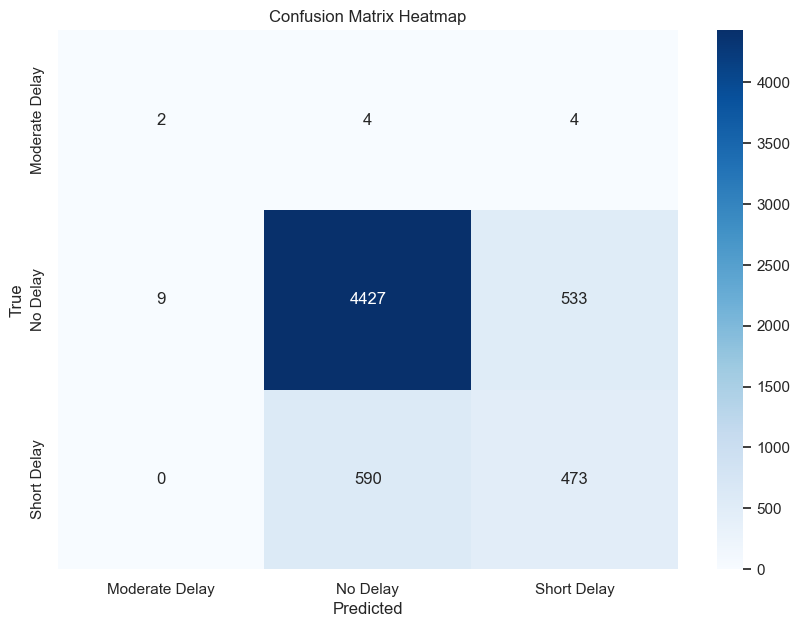

In [141]:
get_evaluations(y_test, yp)

# Kaggle Submission

In [142]:


model_rf = RandomForestClassifier(n_estimators=100, random_state=42)

model_rf.fit(X_train, y_train)

yp = model_rf.predict(X_test)



In [143]:

multi_kaggle_submission = pd.DataFrame({ 'ID': range(1, len(yp[:12914]) + 1), 'Delay': yp[12914] })
multi_kaggle_submission.to_csv('i220472_Multi_Class.csv', index=False)


# Optimization

In [66]:

nfolds=4 # lets use four folds..
folds=generate_folds(np.array(X_train),np.array(y_train),nfolds)
features_2=[0,1, 2] # features_2 to use for our system
#now lets train and test on these folds...

best_acc = 0
best_purity = None
best_nexample = None

#Lets perform the grid search...
depths=np.arange(5, 30, 10)
n_estimators=np.arange(5, 100, 25)

params=np.zeros((len(n_estimators),len(depths)))
                   
for p in range(len(n_estimators)):
    for n in range(len(depths)):
        totacc=[]
        for k in range(nfolds):
            rf = RandomForestClassifier(n_estimators=n_estimators[p], max_depth=depths[n])
            rf.fit(folds[k][0][:,features_2], folds[k][1])
            pclasses=rf.predict(folds[k][2][:,features_2])
            acc=np.sum(pclasses==folds[k][3])/float(folds[k][3].shape[0])
            print ("[Info] Fold {} Accuracy = {}".format(k+1, acc))
            totacc.append(acc)
        mean_acc = np.mean(totacc)
        params[p,n]=np.mean(totacc)
        print (totacc, '\nN-Estimators={}, Max-Depth={}, Mean Accuracy={}'.format(n_estimators[p],depths[n], mean_acc))


        if best_acc < mean_acc:
            best_acc = acc
            best_purity = n_estimators[p]
            best_nexample = depths[n]

print ("Best N-Estimators = ", best_purity, "Best Max-Depth = ", best_nexample, "Accuracy = ", best_acc)


Generating CV data for 3 classes
[Info] Fold 1 Accuracy = 0.8207250455222646
[Info] Fold 2 Accuracy = 0.8217182585664625
[Info] Fold 3 Accuracy = 0.8212216520443635
[Info] Fold 4 Accuracy = 0.8215527230590962
[0.8207250455222646, 0.8217182585664625, 0.8212216520443635, 0.8215527230590962] 
N-Estimators=5, Max-Depth=5, Mean Accuracy=0.8213044197980467
[Info] Fold 1 Accuracy = 0.8263532527727198
[Info] Fold 2 Accuracy = 0.8240357556695911
[Info] Fold 3 Accuracy = 0.8220493295811951
[Info] Fold 4 Accuracy = 0.8228770071180268
[0.8263532527727198, 0.8240357556695911, 0.8220493295811951, 0.8228770071180268] 
N-Estimators=5, Max-Depth=15, Mean Accuracy=0.8238288362853832
[Info] Fold 1 Accuracy = 0.8031782817414336
[Info] Fold 2 Accuracy = 0.812448270153948
[Info] Fold 3 Accuracy = 0.8083098824697897
[Info] Fold 4 Accuracy = 0.8096341665287204
[0.8031782817414336, 0.812448270153948, 0.8083098824697897, 0.8096341665287204] 
N-Estimators=5, Max-Depth=25, Mean Accuracy=0.808392650223473
[Info] F

In [67]:

model_rf = RandomForestClassifier(n_estimators=best_purity, max_depth=best_nexample, random_state=42)

model_rf.fit(X_train, y_train)

yp = model_rf.predict(X_test)



In [68]:
custom_multi_kaggle_submission = pd.DataFrame({ 'ID': range(1, len(yp[:12914]) + 1), 'Delay': yp[12914] })
custom_multi_kaggle_submission.to_csv('i220472_Multi_Class_custom.csv', index=False)


# Regression

In [144]:
features = top_n_features

In [145]:
linear_df = df_train.copy()
linear_df = linear_df[features]

In [146]:
linear_test_df = df_test.copy()
linear_test_df = linear_test_df[features[:-1]]

In [ ]:

# Splitting data for train test
X = linear_df.drop(columns=['departure_delay_minutes'])
y = linear_df['departure_delay_minutes']
X_train, X_val, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_test = linear_test_df.select_dtypes(include=[np.number])



In [148]:

# Using Linear Regression model and evaluating via MAE and RMSE
model_reg = LinearRegression()

model_reg.fit(X_train, y_train)

yp = model_reg.predict(X_val)

mae = mean_absolute_error(y_test, yp)
mse = mean_squared_error(y_test, yp)
rmse = np.sqrt(mse)

print(f"Mean Squared Error (MSE): {mae:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")



Mean Squared Error (MSE): 3.0965
Root Mean Squared Error (RMSE): 5.8214


In [149]:
X_train

,airline_iataCode_ia,airline_icaoCode_iaw,departure_scheduledTime,airline_iataCode_pk,airline_icaoCode_pia,airline_iataCode_zp,airline_icaoCode_azq,Dew Point_Avg (°F),Dew Point_Max (°F),Dew Point_Min (°F)
7916,0.0,0.0,28162960,0.0,0.0,0.0,0.0,79.8,81.0,77.0
18242,0.0,0.0,28539655,0.0,0.0,0.0,0.0,49.0,57.0,41.0
28758,0.0,0.0,28558595,0.0,0.0,0.0,0.0,61.8,66.0,59.0
28284,0.0,0.0,28552820,0.0,0.0,0.0,0.0,61.7,75.0,59.0
13730,0.0,0.0,28362760,0.0,0.0,0.0,0.0,52.9,55.0,52.0
...,...,...,...,...,...,...,...,...,...,...
29802,0.0,0.0,28650990,0.0,0.0,0.0,0.0,69.9,73.0,66.0
5390,0.0,0.0,28558355,0.0,0.0,0.0,0.0,61.8,66.0,59.0
860,0.0,0.0,28229970,0.0,0.0,0.0,0.0,73.3,79.0,68.0
15795,0.0,0.0,28439540,0.0,0.0,0.0,0.0,44.9,48.0,41.0


# Kaggle Submission

In [150]:

model_reg = LinearRegression()

model_reg.fit(X_train, y_train)

yp = model_reg.predict(X_test)



In [151]:
reg_kaggle_submission = pd.DataFrame({ 'ID': range(1, len(yp[:12914]) + 1), 'Delay': yp[12914] })
reg_kaggle_submission.to_csv('i220472_Regression.csv', index=False)

# Normalize and Standardize

In [77]:

# * Standarize X_train
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# * Normalize y_train
y_mean = np.mean(y_train)
y_std = np.std(y_train)
y_normalized = (y_train - y_mean) / y_std

# * Transform X_test using same scaler used for X_train
X_test_numeric_scaled = scaler.transform(X_test)

# Optimization and Cross Validation

In [78]:


class RegularizedLinearRegression:
    def __init__(self, regularization='L2', lambda_=0.1):
        self.theta = None
        self.regularization = regularization
        self.lambda_ = lambda_
        self.cost_history = []  

    def hypothesis(self, X):
        return X.dot(self.theta)

    def cost_function(self, X, y):
        m = len(y)
        predictions = self.hypothesis(X)
        mse = np.sum((predictions - y) ** 2) / m


        if self.regularization == 'L2':
            reg_term = self.lambda_ * np.sum(self.theta[:-1] ** 2)
        elif self.regularization == 'L1':
            reg_term = self.lambda_ * np.sum(np.abs(self.theta[:-1]))
        else:
            reg_term = 0  # No regularization

        return mse + reg_term

    def gradient(self, X, y):
        m = len(y)
        predictions = self.hypothesis(X)
        errors = predictions - y
        grad = (2 / m) * X.T.dot(errors)

        if self.regularization == 'L2':
            grad[:-1] += 2 * self.lambda_ * self.theta[:-1]
        elif self.regularization == 'L1':
            grad[:-1] += self.lambda_ * np.sign(self.theta[:-1])

        return grad

    def gradient_descent(self, X, y, learning_rate=0.01, iterations=1000):
        m, n = X.shape
        self.theta = np.zeros(n)

        for i in range(iterations):
            grad = self.gradient(X, y)
            self.theta -= learning_rate * grad
            cost = self.cost_function(X, y)
            self.cost_history.append(cost)  # Store the cost for plotting

            if i % 100 == 0:
                print(f"Iteration {i}: Cost {cost}")

    def train(self, X, y, learning_rate=0.01, iterations=1000):
        X = self.preprocess_data(X)
        self.gradient_descent(X, y, learning_rate, iterations)
    
    def preprocess_data(self, X):
        # Check if there's only one feature after PCA
        if X.shape[1] == 1:
            # For single feature, we only add its square and a bias term
            return np.hstack([X**2, X, np.ones((X.shape[0], 1))])  # Adding bias term
        else:
            # If there are multiple features, we add their polynomial features
            return np.hstack([np.expand_dims(X[:, 0]**2, axis=-1), 
                              np.expand_dims(X[:, 1]**2, axis=-1),
                              np.expand_dims(X[:, 0] * X[:, 1], axis=-1),
                              X, 
                              np.ones((X.shape[0], 1))])  # Adding bias term
 
    def plot_2D_regression(self, X, y, learning_rate=0.001, iterations=1000):

        # Backup original theta
        original_theta = self.theta.copy() if self.theta is not None else None

        # Apply PCA for dimensionality reduction
        pca = PCA(n_components=1)
        X_pca = pca.fit_transform(X)

        # Train the model using the reduced dataset
        self.train(X_pca, y, learning_rate=learning_rate, iterations=iterations)

        # Plot the data points and regression line
        plt.scatter(X_pca, y, color='blue', label='Data Points')
        x_range = np.linspace(min(X_pca), max(X_pca), 100).reshape(-1, 1)
        y_line = self.predict(x_range)
        plt.plot(x_range, y_line, color='red', label='Regression Line')
        plt.xlabel('Principal Component (1D)')
        plt.ylabel('Target Y')
        plt.legend()
        plt.title("2D Regression with PCA")
        plt.show()

        # Restore original theta
        self.theta = original_theta

    def predict(self, X):

        X = self.preprocess_data(X)
        return self.hypothesis(X)

    def plot_model(self, X, y):
        if X.shape[1] == 1:
            # For single feature, plot a line
            plt.scatter(X[:, 0], y, color='red', label='Actual Data')
            X_line = np.linspace(X[:, 0].min(), X[:, 0].max(), 100).reshape(-1, 1)
            y_line = self.predict(X_line)
            plt.plot(X_line, y_line, color='blue', label='Prediction Line')
            plt.xlabel('Feature 1')
            plt.ylabel('Target')
            plt.title('Linear Regression (Single Feature)')
            plt.legend()
            plt.show()

        elif X.shape[1] == 2:
            # For two features, plot a plane
            fig = plt.figure()
            ax = fig.add_subplot(111, projection='3d')
            ax.scatter(X[:, 0], X[:, 1], y, color='red', label='Actual Data')

            # Create a meshgrid for the plane
            x1_range = np.linspace(X[:, 0].min(), X[:, 0].max(), 50)
            x2_range = np.linspace(X[:, 1].min(), X[:, 1].max(), 50)
            x1_mesh, x2_mesh = np.meshgrid(x1_range, x2_range)
            X_plane = np.c_[x1_mesh.ravel(), x2_mesh.ravel()]
            y_plane = self.predict(X_plane).reshape(x1_mesh.shape)

            ax.plot_surface(x1_mesh, x2_mesh, y_plane, color='blue', alpha=0.5, label='Prediction Plane')
            ax.set_xlabel('Feature 1')
            ax.set_ylabel('Feature 2')
            ax.set_zlabel('Target')
            plt.title('Linear Regression (Two Features)')
            plt.legend()
            plt.show()

    def plot_gradient_descent(self):
        """
        Plots the cost function values over iterations of gradient descent.
        """
        plt.figure(figsize=(8, 6))
        plt.plot(self.cost_history, label='Cost Function')
        plt.xlabel('Iteration')
        plt.ylabel('Cost')
        plt.title('Gradient Descent Progress')
        plt.legend()
        plt.show()



In [79]:

nfolds=4 # lets use four folds..
folds=generate_folds(np.array(X_scaled),np.array(y_normalized),nfolds)

#Lets perform the grid search...
lrs=np.linspace(0.0005,0.00000001,13) # You can also search over depth as well....
best_lr=None
best_acc = 100

for lr in lrs:                   
    totacc=[]
    for k in range(nfolds):
        dt=RegularizedLinearRegression(regularization='L2', lambda_=0.0)
        dt.train(folds[k][0],folds[k][1], learning_rate=lr, iterations=1000)
        pclasses=dt.predict(folds[k][2])

        # acc = mean_squared_error(folds[k][3], pclasses)
        try:
            acc = mean_absolute_error(folds[k][3], pclasses)
        except:
            acc = 100

        print ("[Info] Fold {} MAE = {}".format(k+1, acc))
        totacc.append(acc)

    mean_acc = np.mean(totacc)

    print (totacc, '\nMean MAE ={}'.format(mean_acc))

    if best_acc > mean_acc:
        best_acc = acc
        best_lr = lr

print ("Best Learning Rate = ", best_lr, "MAE = ", best_acc)

Generating CV data for 74 classes
Iteration 0: Cost 1.0672139937676064
Iteration 100: Cost 1.051267326555593
Iteration 200: Cost 1.0428421212738006
Iteration 300: Cost 1.0374967909854302
Iteration 400: Cost 1.0340591962984007
Iteration 500: Cost 1.031814417793845
Iteration 600: Cost 1.0303232352549427
Iteration 700: Cost 1.029313696286661
Iteration 800: Cost 1.0286159909006236
Iteration 900: Cost 1.0281231114170053
[Info] Fold 1 MAE = 0.501880240399527
Iteration 0: Cost 1.0639028055100597
Iteration 100: Cost 1.0484925624843218
Iteration 200: Cost 1.0403898146112525
Iteration 300: Cost 1.0352666617468622
Iteration 400: Cost 1.0319823273914575
Iteration 500: Cost 1.0298440722625268
Iteration 600: Cost 1.0284279447643885
Iteration 700: Cost 1.0274723108210602
Iteration 800: Cost 1.0268142463972256
Iteration 900: Cost 1.0263513031357534
[Info] Fold 2 MAE = 0.5082466937680102
Iteration 0: Cost 1.0622691406319955
Iteration 100: Cost 1.0488337683660114
Iteration 200: Cost 1.0413196401649045
I

In [80]:

lin_reg = RegularizedLinearRegression()

lin_reg.train(np.array(X_scaled), np.array(y_normalized), learning_rate=best_lr)

yp = lin_reg.predict(np.array(X_test_numeric_scaled))


Iteration 0: Cost 0.9819534653914459
Iteration 100: Cost 0.971181748345742
Iteration 200: Cost 0.9647631162301701
Iteration 300: Cost 0.9605916284230911
Iteration 400: Cost 0.9578483152565946
Iteration 500: Cost 0.9560218212088547
Iteration 600: Cost 0.9547898344440577
Iteration 700: Cost 0.9539473301619229
Iteration 800: Cost 0.953362718273954
Iteration 900: Cost 0.9529507894767622


In [81]:
yp

array([-0.1973432 ,  0.08829932, -0.1864421 , ..., -0.02812765,
       -0.02576795, -0.02363751])

In [82]:
# Reversing the normalization for prediction
y_test_original = yp * y_std + y_mean
y_test_original

array([0.7754116 , 2.48647729, 0.8407117 , ..., 1.78905242, 1.8031876 ,
       1.8159494 ])

In [83]:
submission_data = pd.DataFrame({'ID': range(1, len(y_test_original[:12914]) + 1), 'Delay': y_test_original[12914] })
submission_data.to_csv('i220472_Regression_custom.csv', index=False)

# Model Comparison

# Public Scores : 
# Binary Classification - Logistic Regression = 0.7513
# Multi-Class Classification - Random Forest = 0.74149
# Regression - Linear Regression = 4826.64754

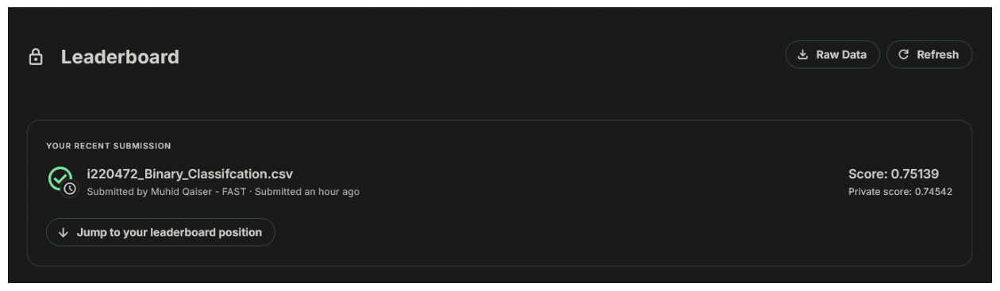

In [ ]:

# Load the image
image = mpimg.imread('Bin.PNG')
plt.figure(figsize=(16, 9))

# Display the image
plt.imshow(image)
plt.axis('off')  
plt.show()


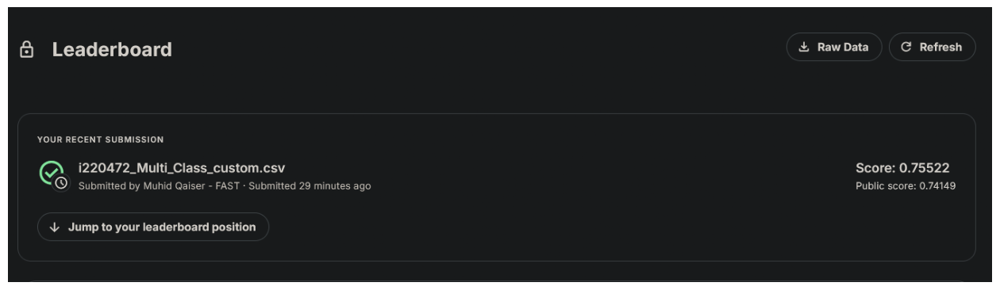

In [171]:
# Load the image
image = mpimg.imread('Multi.PNG')
plt.figure(figsize=(16, 9))

# Display the image
plt.imshow(image)
plt.axis('off')  
plt.show()

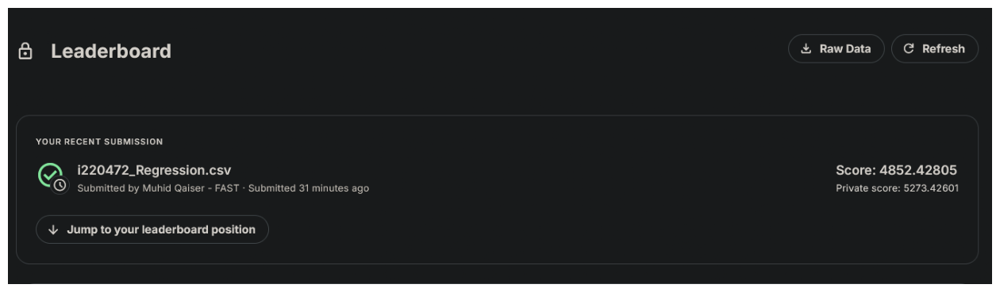

In [172]:
# Load the image
image = mpimg.imread('Reg.PNG')
plt.figure(figsize=(16, 9))

# Display the image
plt.imshow(image)
plt.axis('off')  
plt.show()